# Project 2: Disease Containment

In [2]:
%matplotlib notebook   

import matplotlib    # Library used for plotting
import numpy as np   # Numerical library
import matplotlib.pyplot as plt # Plot commands

import scipy         # Another numerical library
from scipy import integrate

# Define some colors using the RGB format
my_lilac = (169/255,89/255,201/255);
my_blue = (100/255,101/255,218/255);
my_green = (106/255,178/255,71/255);
my_orange = (209/255,135/255,46/255);
my_red = (215/255,67/255,84/255);

## Authors: Minwoo and Samen

## Introduction

Given the attention the COVID-19 has received recently, it is only appropriate that we dedicate this project to studying the spread of disease in groups. Here, we will focus on a community that's not too different from the Yale-NUS student body. This community will be composed of a few hundred individuals, mostly isolated from the outside world. We will study how the spread of the disease can be controlled via behavior-altering strategies and immunization.

## Creating the System

Before the disease is even introduced, we need to generate the system by creating an *adjacency matrix*. For a population of $N$ individuals it is a symmetric $N \times N$ matrix whose entries give the probabilities that two individuals, corresponding to the row and column, will interact on a given day. For example

$$
M =
\begin{pmatrix}
    0 & 1/2 & 1/3 & 1 /10
    \\
    1/2 & 0 & 5/6 & 1/5
    \\
    1/3 & 5 /6 & 0 & 1/8
    \\
    1/10 & 1/5 & 1/8 & 0
\end{pmatrix}
$$

shows that Person-1 has a 50% chance of meeting up with Person-2, 33% with Person-3 and 10% with Person-4. We can also see that Person-2 and Person-3 are probably friends, and Person-4 probably wants to talk about Bitcoin to everyone. The sum of the numbers in the $j$th row (or column) gives the average number of people that person $j$ interacts with every day. To reiterate, *the matrix must be symmetric*.

To create the system of $N$ people, we need to come up with a way of filling out the adjacency matrix. At this point, we are not talking about the coding part! We need to figure out how the numbers in the matrix are distributed in a realistic manner.

## Step 1: Create a N x N matrix

In [111]:
N = 100

pop_matrix = np.matrix([[0.0]*N]*N)
print(pop_matrix)
print(pop_matrix.shape)
# print(len(pop_matrix))
# print(len(pop_matrix[0]))

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(100, 100)


## Step 2: Fill up the matrix with numbers drawn from an exponential distribution

We use the acceptance-rejection method from W4

In [112]:
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.1, 1)

print(pop_matrix)

100
[[0.02151894 0.17591403 0.09064155 ... 0.0410361  0.11624305 0.02672238]
 [0.         0.05071783 0.20734925 ... 0.16127925 0.12023874 0.01510972]
 [0.         0.         0.04422252 ... 0.35550115 0.0506156  0.00633593]
 ...
 [0.         0.         0.         ... 0.06848239 0.09561724 0.17194412]
 [0.         0.         0.         ... 0.         0.02012768 0.20704038]
 [0.         0.         0.         ... 0.         0.         0.03185011]]


In [113]:
# To get a symmetric matrix
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]
        
print(pop_matrix)
print(np.max(pop_matrix))

[[0.02151894 0.17591403 0.09064155 ... 0.0410361  0.11624305 0.02672238]
 [0.17591403 0.05071783 0.20734925 ... 0.16127925 0.12023874 0.01510972]
 [0.09064155 0.20734925 0.04422252 ... 0.35550115 0.0506156  0.00633593]
 ...
 [0.0410361  0.16127925 0.35550115 ... 0.06848239 0.09561724 0.17194412]
 [0.11624305 0.12023874 0.0506156  ... 0.09561724 0.02012768 0.20704038]
 [0.02672238 0.01510972 0.00633593 ... 0.17194412 0.20704038 0.03185011]]
0.7138920696303904


In [114]:
# Scale the matrix so that none of the values exceed 1
maximum = np.max(pop_matrix)
def normalizer(x, maxi):
    return (x/maxi)

pop_matrix = normalizer(pop_matrix, maximum)

print(pop_matrix)
print(np.max(pop_matrix))

[[0.03014313 0.24641544 0.12696814 ... 0.05748222 0.16283001 0.03743196]
 [0.24641544 0.07104412 0.29044902 ... 0.22591545 0.16842706 0.02116528]
 [0.12696814 0.29044902 0.06194567 ... 0.49797604 0.07090091 0.00887519]
 ...
 [0.05748222 0.22591545 0.49797604 ... 0.09592821 0.13393795 0.24085451]
 [0.16283001 0.16842706 0.07090091 ... 0.13393795 0.02819428 0.29001636]
 [0.03743196 0.02116528 0.00887519 ... 0.24085451 0.29001636 0.04461475]]
1.0


In [115]:
# Set the diagonal to 0
for i in range(row_size):
    pop_matrix[i,i] = 0

print(pop_matrix)

[[0.         0.24641544 0.12696814 ... 0.05748222 0.16283001 0.03743196]
 [0.24641544 0.         0.29044902 ... 0.22591545 0.16842706 0.02116528]
 [0.12696814 0.29044902 0.         ... 0.49797604 0.07090091 0.00887519]
 ...
 [0.05748222 0.22591545 0.49797604 ... 0.         0.13393795 0.24085451]
 [0.16283001 0.16842706 0.07090091 ... 0.13393795 0.         0.29001636]
 [0.03743196 0.02116528 0.00887519 ... 0.24085451 0.29001636 0.        ]]


## Step 3: Create a list of lists of length N for each community member

Here we create a matrix of size N x 5 where each row represents a member of the community. There are 5 columns: <br>
(1) has a value of 0 (not infected), 1 (infected) or 2 (quarantined) <br>
(2) the incubation period for a person infected with the virus, before showing any symptoms <br>
(3) the incubation count (in days since the time of infection) <br>
(4) the quarantine count (in days since the time of quarantine) <br>
(5) a placeholder in the for loop to indicate if a person has contracted the disease (1) or not (0) in that particular iteration. Set to 0 after each iteration of the loop.

In [124]:
members = np.matrix([[0.0]*5]*N)
#print(members)
print(members.shape)

(100, 5)


In [125]:
# Randomly select an incubation period for each community period.
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)
    
print(members)

[[ 0. 13.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  4.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0. 11.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0. 10.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  3.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0. 14.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  4.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0.  3.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0. 14.  

## Step 4: Seeding: Introducing COVID-19 to our community :(

In [126]:
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)
print(unfortunate_souls)

[65  5 86 79 69]


In [127]:
for i in unfortunate_souls:
    members[i,0] = 1
    
print(members)

[[ 0. 13.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 1.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  4.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0. 11.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0. 10.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  3.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0. 14.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  4.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0.  3.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0. 14.  

In [128]:
# Update incubation count
# Check if person shows symptoms, if yes, quarantine them
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

print(members)

[[ 0. 13.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  4.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0. 11.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0. 10.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  3.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0. 14.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 0.  4.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0.  3.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0. 14.  

## Step 5(a): Propagate the system

In [129]:
# See if members of the community catches the virus from those who are infected in a day
for i in range(N):
    if members[i,0]==1: # check if person is already infected
        print(i)
        for j in range(N):
            if members[j,0]==2: # check if person is quarantined
                continue
            else:
                x = np.random.rand()
                if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                    members[j,4] = 1
                    

for i in range(N):
    if members[i,4] == 1:
        members[i,0] = 1
        members[i,4] = 0
                    
print(members)

5
65
69
79
86
[[ 1. 13.  0.  0.  0.]
 [ 1. 13.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 1.  2.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 1.  9.  0.  0.  0.]
 [ 1.  4.  0.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 1.  7.  0.  0.  0.]
 [ 0. 11.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0. 10.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 1.  6.  0.  0.  0.]
 [ 1.  3.  0.  0.  0.]
 [ 1.  5.  0.  0.  0.]
 [ 1.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1. 14.  0.  0.  0.]
 [ 1.  6.  0.  0.  0.]
 [ 1. 13.  0.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1.  6.  0.  0.  0.]
 [ 1.  9.  0.  0.  0.]
 [ 1.  4.  0.  0.  0.]
 [ 1. 12.  0.  0.  0.]
 [ 1.  2.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 1.  3.  0.  0.  0.]
 [ 1.  5.  0.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 1.  2.  0.  0.  0.]
 [ 1.  6.  0.  0.  0

## Step 5(b): Propagate the system

In [130]:
# Update the incubation count
# Check if the incubation count has reached the incubation period, if yes, quarantine them
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

print(members)

[[ 1. 13.  1.  0.  0.]
 [ 1. 13.  1.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1. 13.  1.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 1.  5.  2.  0.  0.]
 [ 1.  2.  1.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 1.  9.  1.  0.  0.]
 [ 1.  4.  1.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 1.  7.  1.  0.  0.]
 [ 0. 11.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0. 10.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1.  3.  1.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1. 14.  1.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1. 13.  1.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1.  9.  1.  0.  0.]
 [ 1.  4.  1.  0.  0.]
 [ 1. 12.  1.  0.  0.]
 [ 1.  2.  1.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 1.  3.  1.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 1.  2.  1.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1. 14.  

## Step 5(c): Propagate the system

In [131]:
# Update the quarantine count
# If the quarantine count has reached the quarantine period which we set to be 14, release the indidual back to the community
for i in range(N):
    if members[i,0] == 2:
        members[i,3] += 1
        if members[i,3] == 14:
            members[i,0] = 0
            members[i,3] = 0

print(members)

[[ 1. 13.  1.  0.  0.]
 [ 1. 13.  1.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1. 13.  1.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 1.  5.  2.  0.  0.]
 [ 1.  2.  1.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 1.  9.  1.  0.  0.]
 [ 1.  4.  1.  0.  0.]
 [ 0. 13.  0.  0.  0.]
 [ 1.  7.  1.  0.  0.]
 [ 0. 11.  0.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 0. 10.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1.  3.  1.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1. 14.  1.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1. 13.  1.  0.  0.]
 [ 0.  6.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0.  7.  0.  0.  0.]
 [ 0.  5.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0. 12.  0.  0.  0.]
 [ 0.  9.  0.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1.  9.  1.  0.  0.]
 [ 1.  4.  1.  0.  0.]
 [ 1. 12.  1.  0.  0.]
 [ 1.  2.  1.  0.  0.]
 [ 0.  8.  0.  0.  0.]
 [ 1.  3.  1.  0.  0.]
 [ 1.  5.  1.  0.  0.]
 [ 0.  2.  0.  0.  0.]
 [ 1.  2.  1.  0.  0.]
 [ 1.  6.  1.  0.  0.]
 [ 1. 14.  

## Step 5(d): Propagate the system

In [132]:
# keep tally of all the variables
total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

healthy = np.sum(members==0, 0)[0,0]
infected = np.sum(members==1, 0)[0,0]
quarantined = np.sum(members==2, 0)[0,0]
total_infected += infected

healthy_list.append(healthy)
infected_list.append(infected)
quarantined_list.append(quarantined)
total_infected_list.append(total_infected)

print(healthy)
print(infected)
print(quarantined)
print(total_infected)

print(healthy_list)
print(infected_list)
print(quarantined_list)
print(total_infected_list)

37
63
0
63
[37]
[63]
[0]
[63]


## Step 6: Tying it all together

1000


<IPython.core.display.Javascript object>


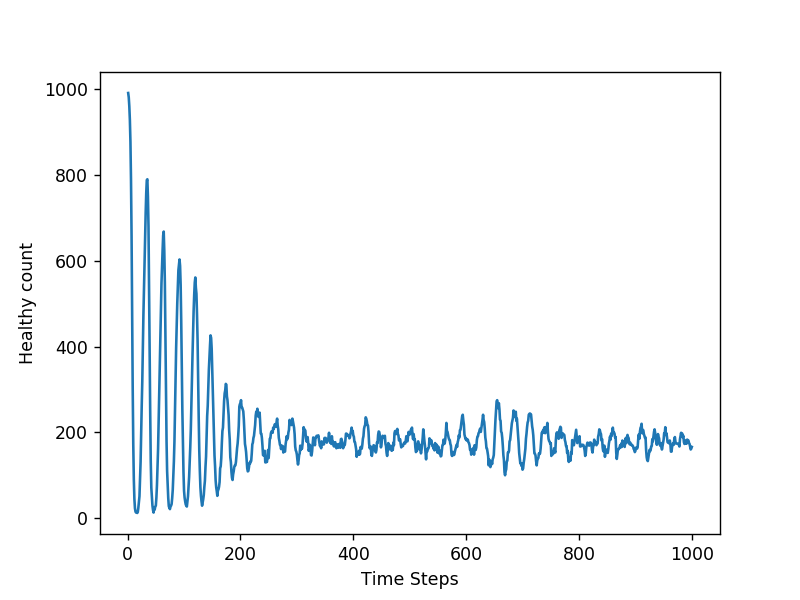

<IPython.core.display.Javascript object>


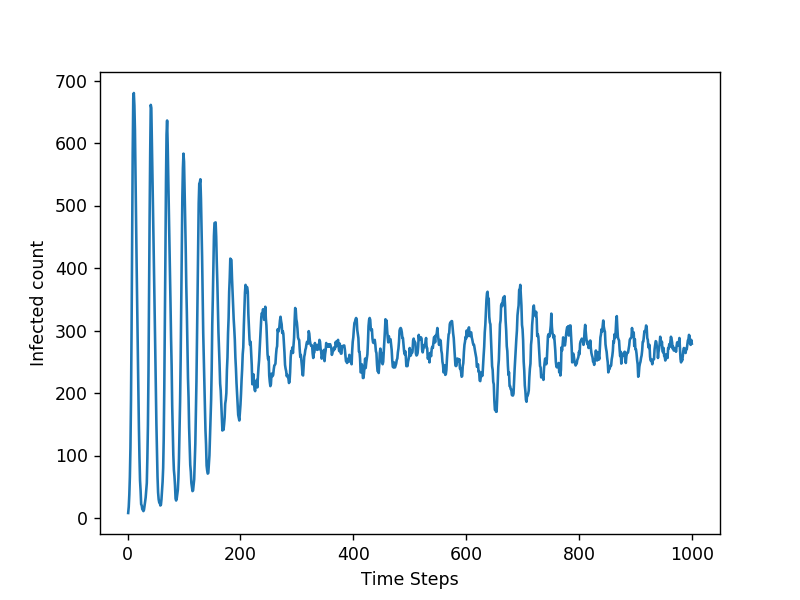

<IPython.core.display.Javascript object>


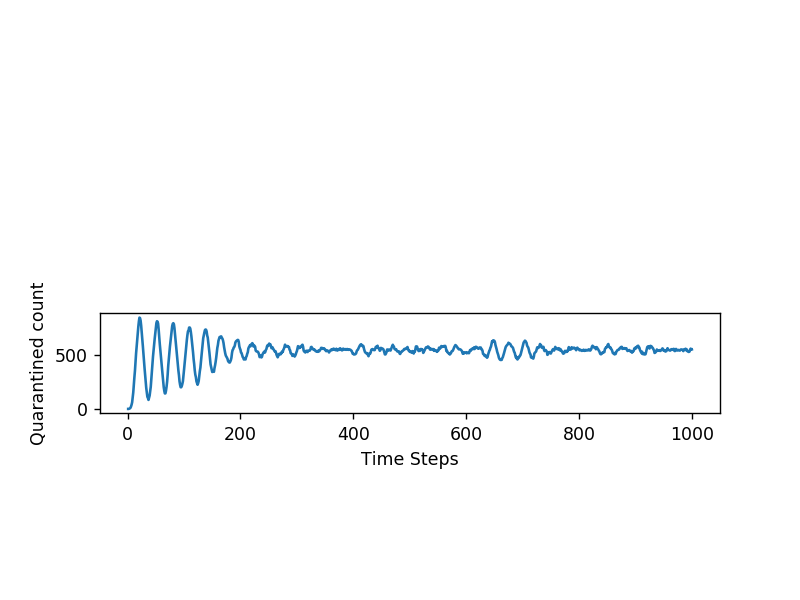

<IPython.core.display.Javascript object>


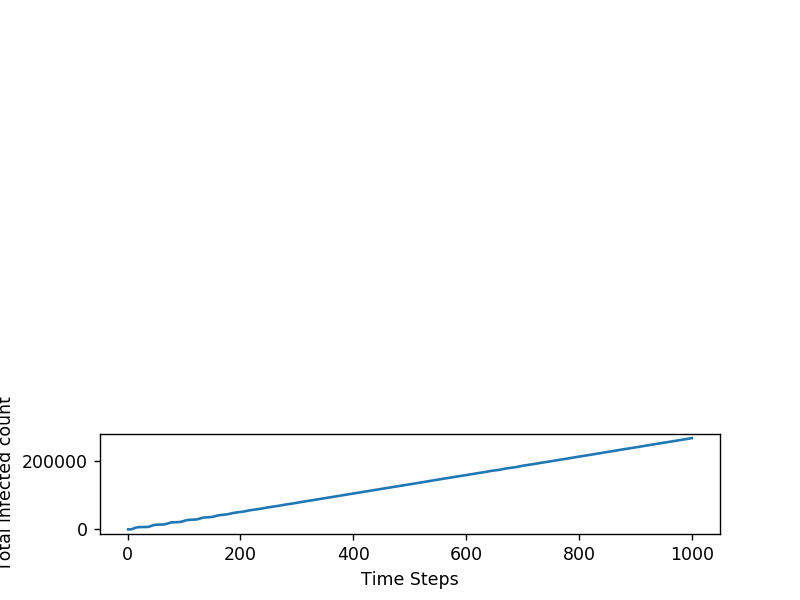

[Text(0, 0.5, 'Total infected count'), Text(0.5, 0, 'Time Steps')]

In [192]:
# Step 1
N = 1000
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.001, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")


In [193]:
print(members)

[[ 2.  4.  0. 13.  0.]
 [ 1. 12.  8.  0.  0.]
 [ 0. 11.  0.  0.  0.]
 ...
 [ 2.  7.  0. 12.  0.]
 [ 1.  3.  1.  0.  0.]
 [ 2.  7.  0. 12.  0.]]


(1000, 1)
[[1.03548342]
 [1.0479166 ]
 [1.04768986]
 [1.02728171]
 [0.98244521]
 [1.02001884]
 [0.99489274]
 [0.9884261 ]
 [0.9666522 ]
 [0.96452339]
 [1.00000893]
 [1.00271096]
 [1.05624042]
 [0.9848955 ]
 [1.00378699]
 [0.98502077]
 [0.95997211]
 [0.98701183]
 [1.02956401]
 [1.02913623]
 [0.95478273]
 [0.92549418]
 [0.99429946]
 [0.95403295]
 [0.98272563]
 [0.99229717]
 [0.96751902]
 [1.00809388]
 [0.99102718]
 [1.01037846]
 [1.02176723]
 [0.91332555]
 [1.01102939]
 [0.97698984]
 [1.01965166]
 [1.02754916]
 [1.00332524]
 [0.96939382]
 [1.01466017]
 [1.03021999]
 [1.01684679]
 [0.9875122 ]
 [0.9926782 ]
 [0.99668356]
 [1.02610514]
 [1.01019823]
 [1.03677745]
 [0.96042282]
 [1.01342311]
 [1.03270456]
 [0.97632274]
 [1.04587537]
 [1.01403588]
 [0.97840105]
 [1.04334235]
 [0.95209016]
 [0.97525972]
 [0.99441696]
 [1.00514119]
 [1.03100399]
 [0.99681479]
 [1.02930167]
 [0.96173533]
 [1.01171608]
 [1.00577767]
 [0.98712366]
 [0.991529  ]
 [0.98447222]
 [1.03368535]
 [0.99570978]
 [0.996642

<IPython.core.display.Javascript object>


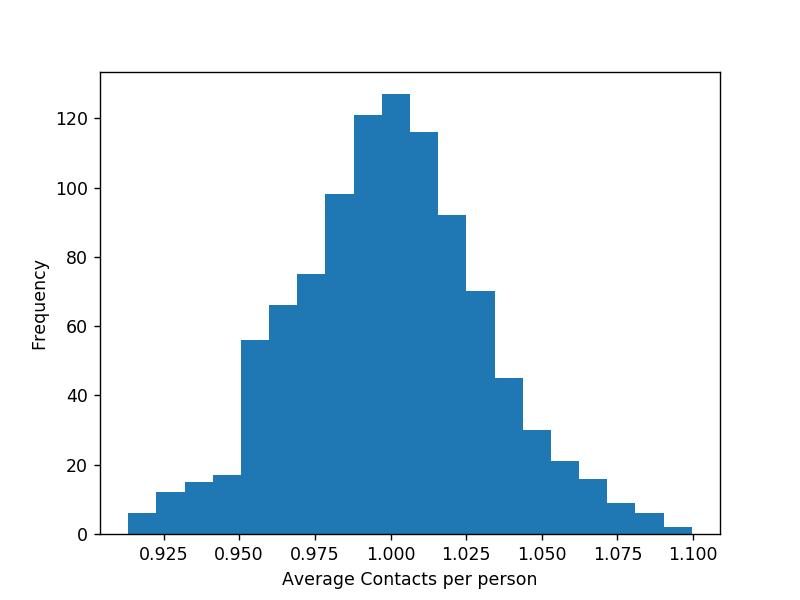

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [195]:
print((np.sum(pop_matrix, 1)).shape)
print(np.sum(pop_matrix, 1))

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

## Variables

So now we are done with the initial task of setting up the system. Its time to change the variables and see their effects on the system. We have listed the variables below: <br>
(1) Population matrix values <br>
(2) Population size <br>
(3) Initialization: No. of people infected at the beginning <br>
(4) Timesteps <br>
(5) Quarantine period <br>
(6) Incubation period <br>
(7) Vaccination <br>

Note that we have listed the variables randomly (not according to importance or anything). We will now look at each variable individually.

#### Variable 1: Population matrix values

We have assumed that the interactions between members of the community can be modelled by an exponential distribution with a long tail. To test our hypotheses we choose our matrix entries from exponential distributions where beta varies from 0.001 to 0.01. We count the row sums for each matrix to estimate the average number of interactions per person per day. Remember, the matrix entries are the likelihood that any 2 person are interacting on an average day. As such, the numbers encompass both the sociability of individuals and the contagion of the disease. Later we will try to find out the matrix that most closely resembles reality. <br>

Note: All other variables are kept constant in this investigation.

##### beta = 0.001

100


<IPython.core.display.Javascript object>


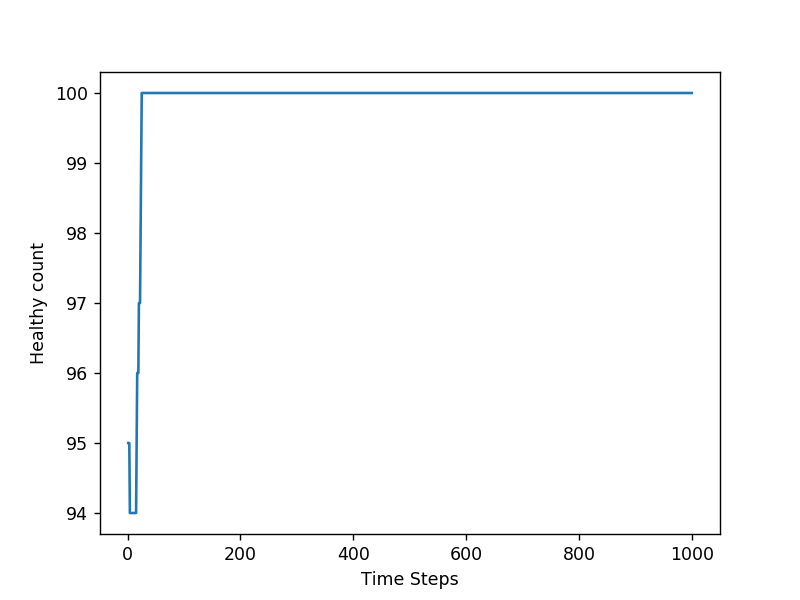

<IPython.core.display.Javascript object>


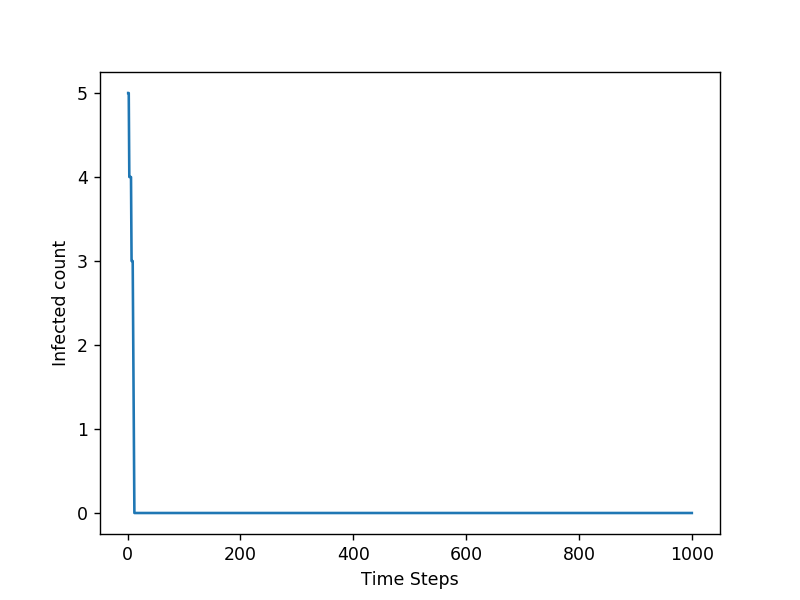

<IPython.core.display.Javascript object>


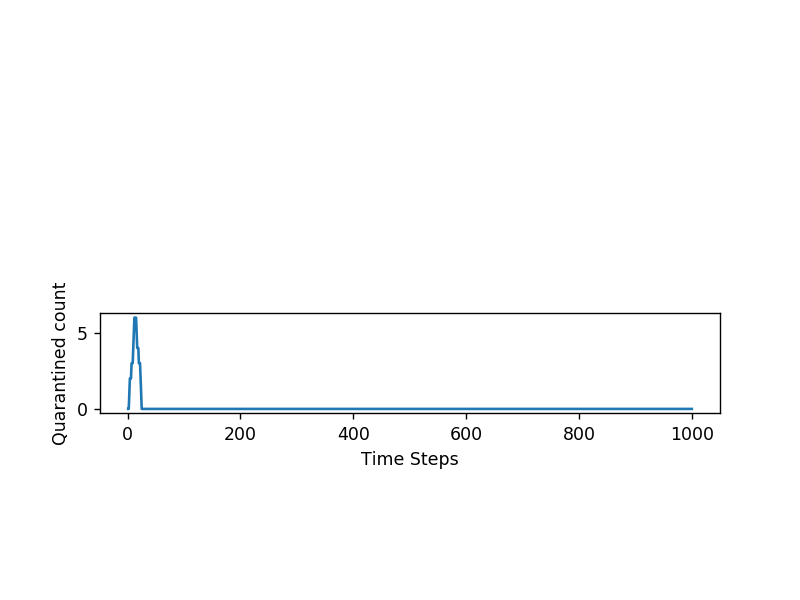

<IPython.core.display.Javascript object>


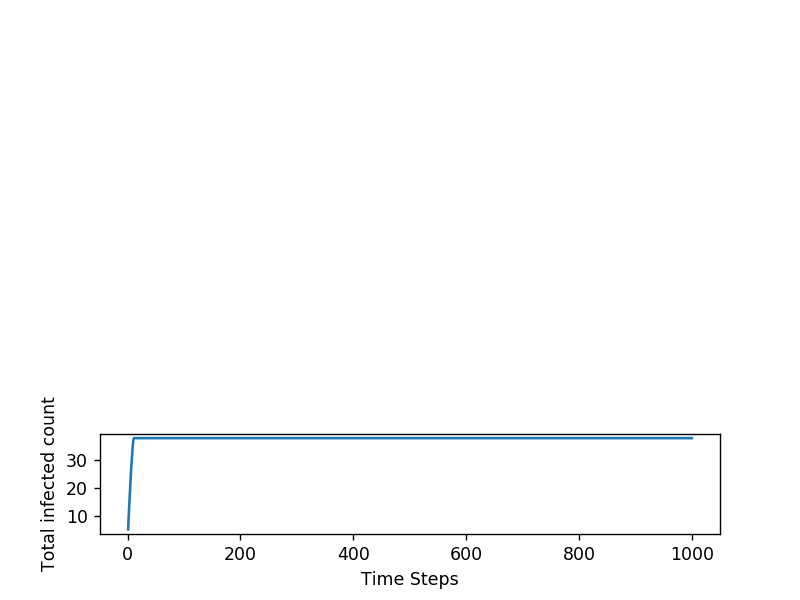

<IPython.core.display.Javascript object>


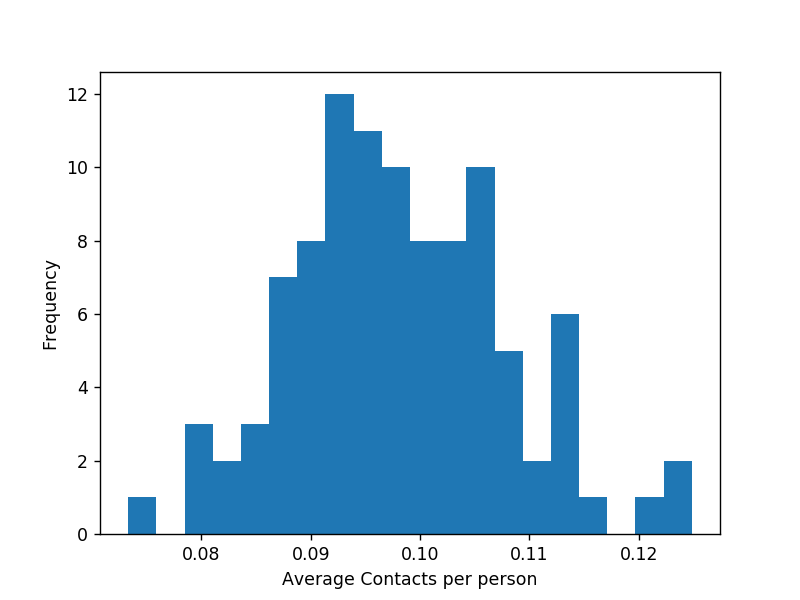

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [197]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.001, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### beta = 0.005

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


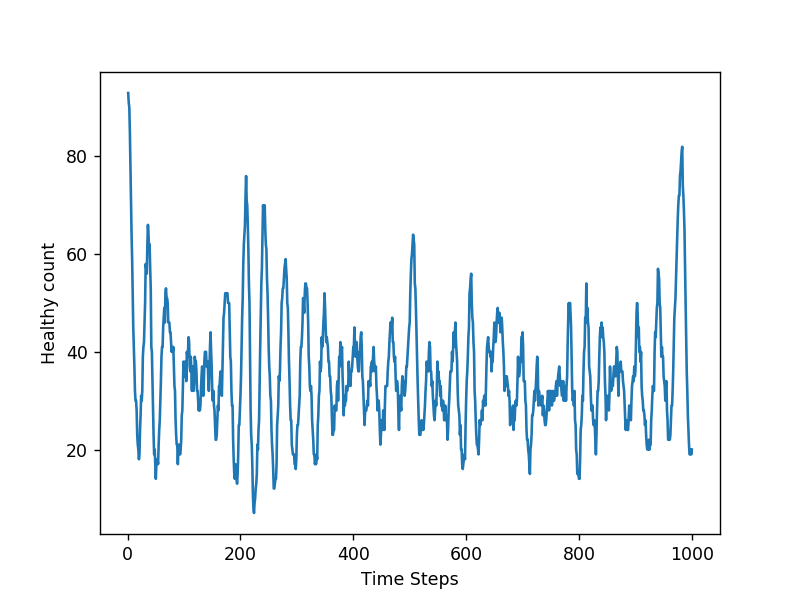

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


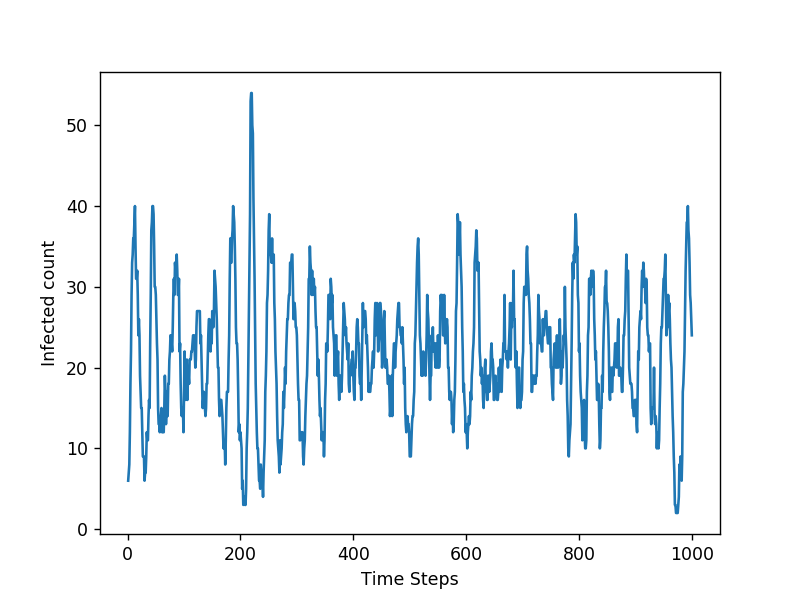

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


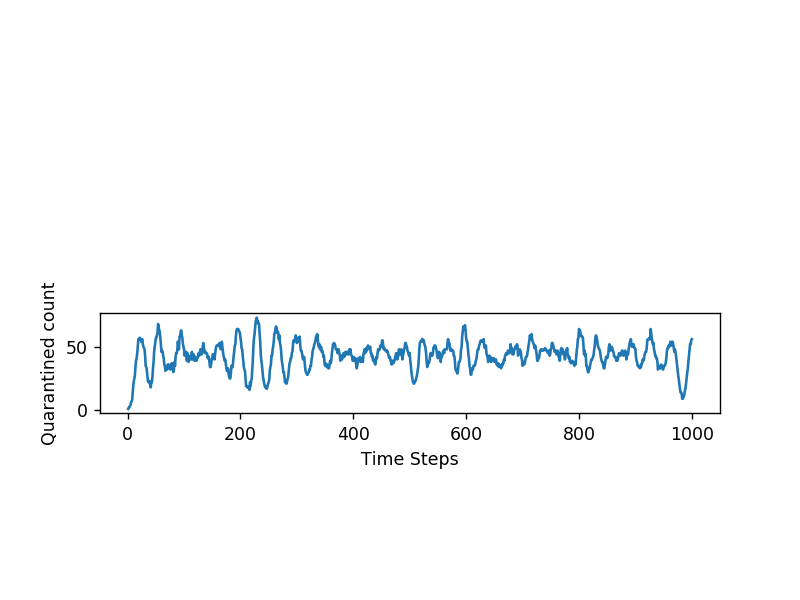

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


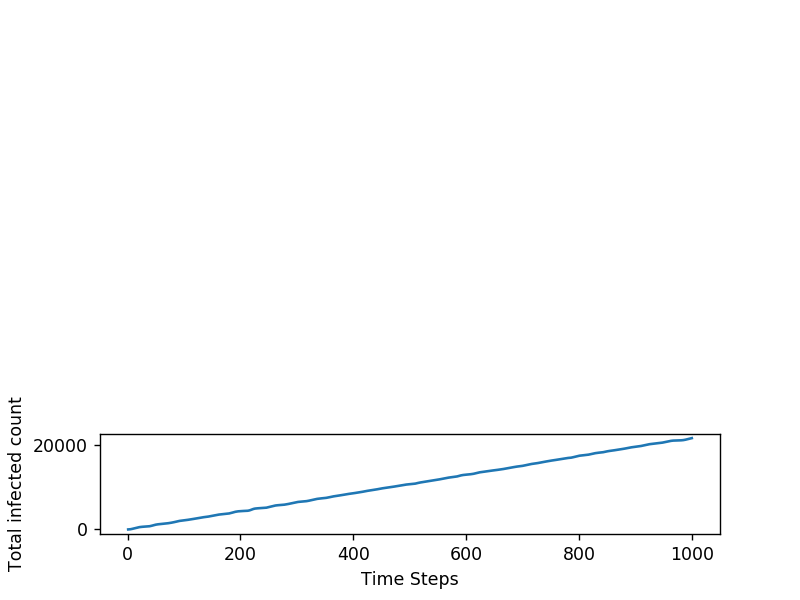

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


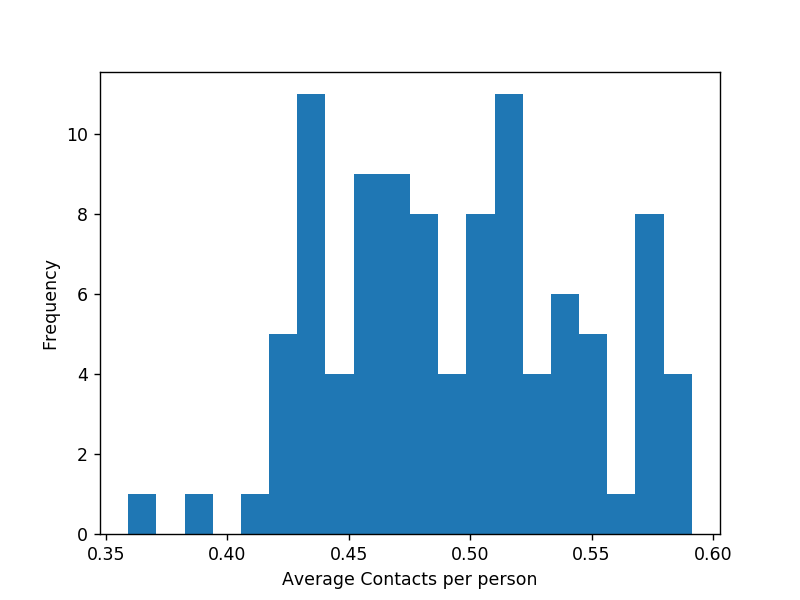

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [199]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### beta = 0.01

100


<IPython.core.display.Javascript object>


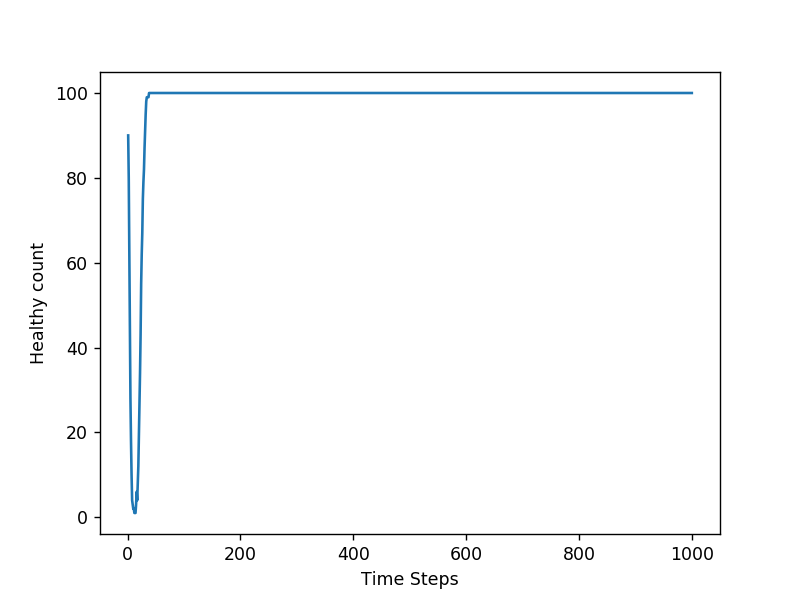

<IPython.core.display.Javascript object>


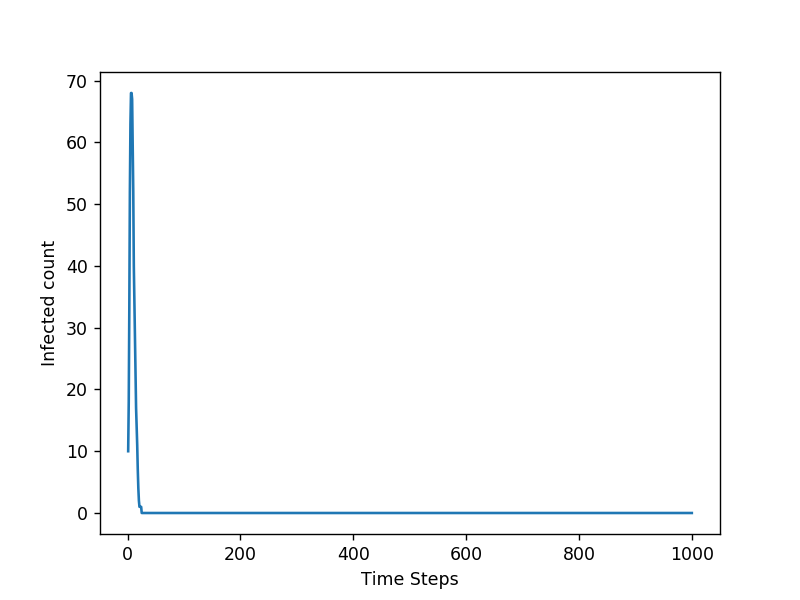

<IPython.core.display.Javascript object>


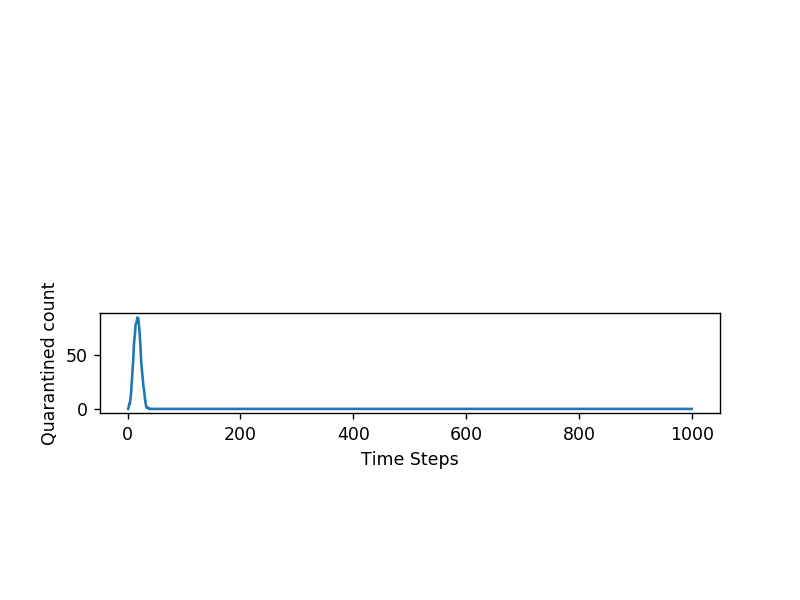

<IPython.core.display.Javascript object>


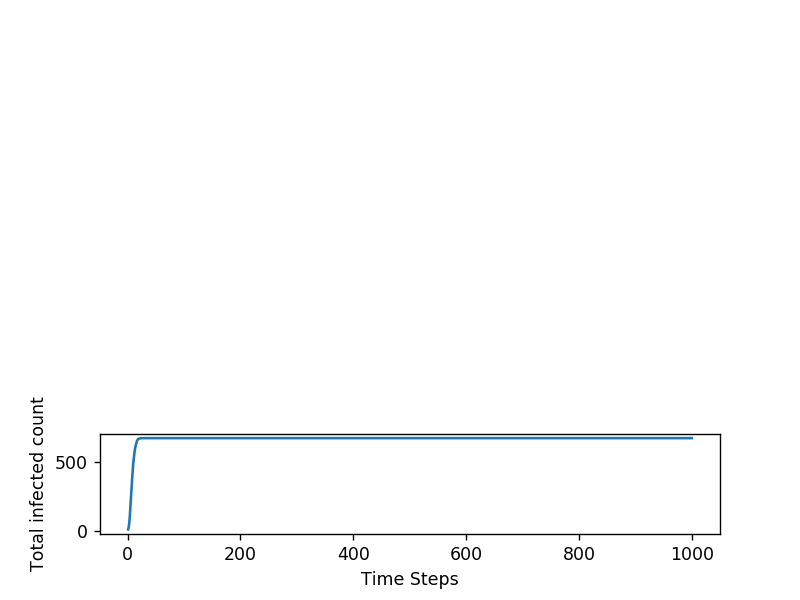

<IPython.core.display.Javascript object>


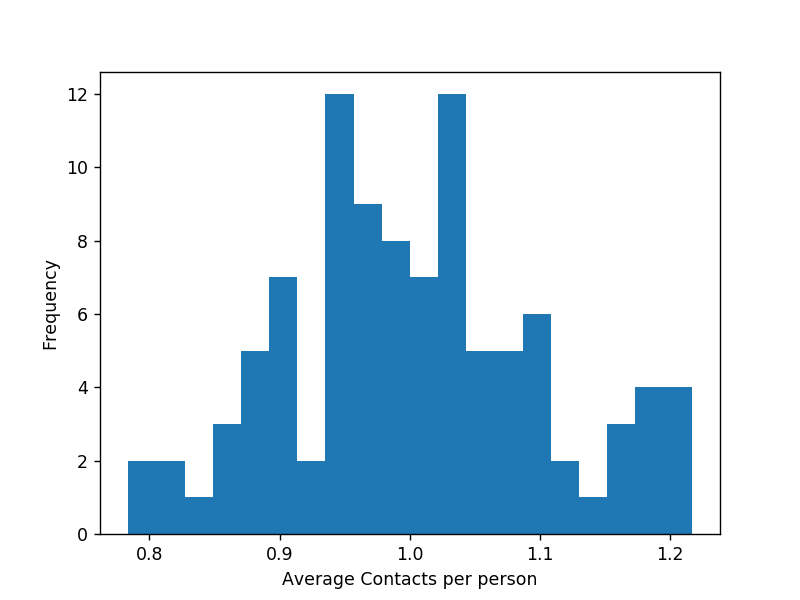

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [198]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.01, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: The three beta values represent 3 possible fates of the system. <br>
(1) At beta = 0.001, the contact between individuals is so low that there isn't transmission of the virus in the community. <br>
(2) At beta = 0.01, the contact between indiduals is so high that everyone in the community gets infected and subsequently quarantined. <br>
(3) At beta = 0.005, the system shows oscillatory behaviour marking the boundary between the 2 other fates.

#### Variable 2: Population size

We want to make sure our investigation is robust to changes in the population size. We don't want a small population size to significantly affect our results. So we would vary our population size from 10 to 1000 with step sizes of a factor of 10. <br>

However we acknowledge for a community like Yale-NUS the population size should be around 1000. <br>

Note: All other variables are kept constant in this investigation.

##### N = 10

10


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


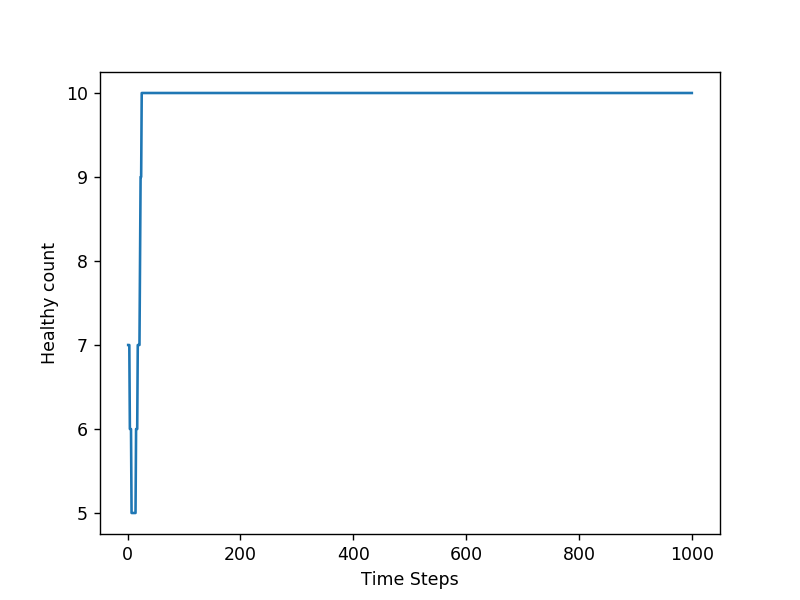

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


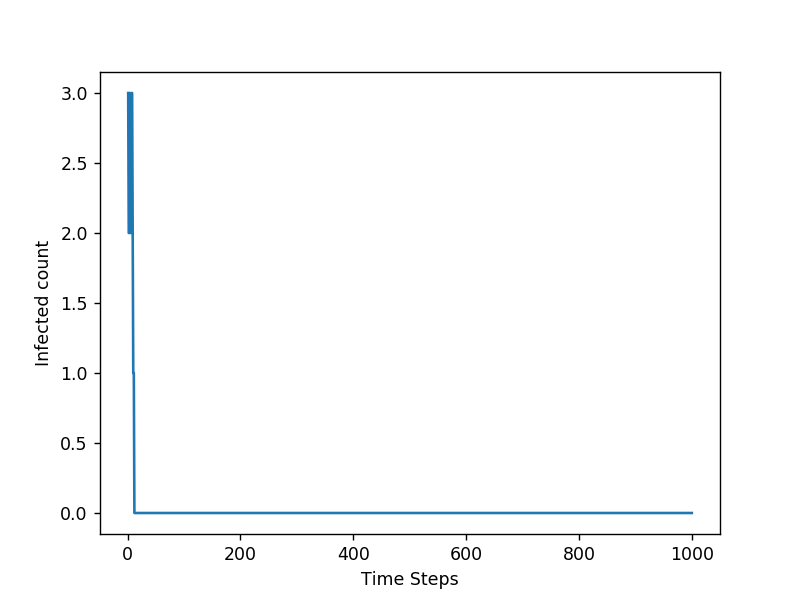

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


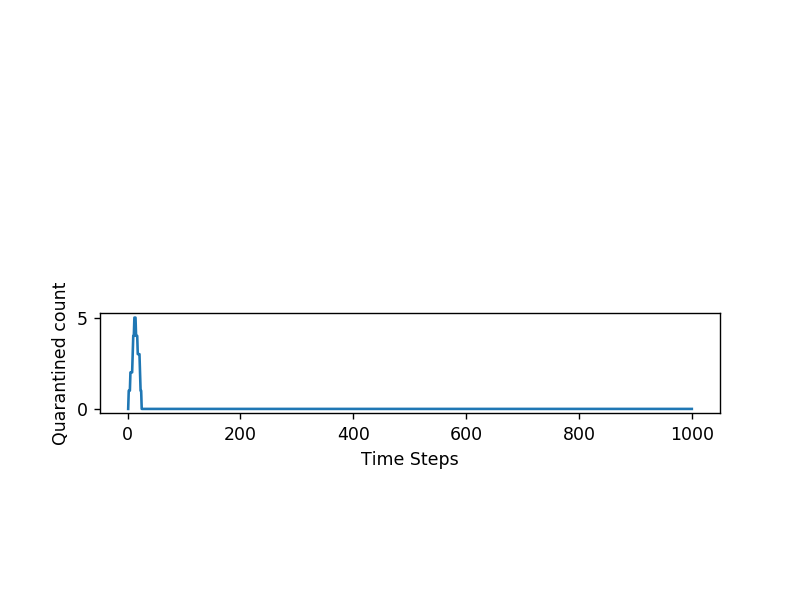

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


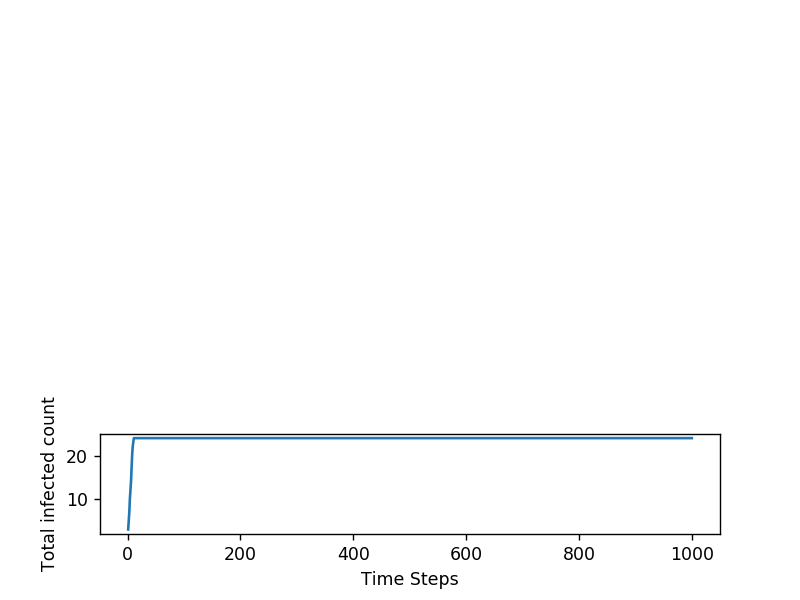

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


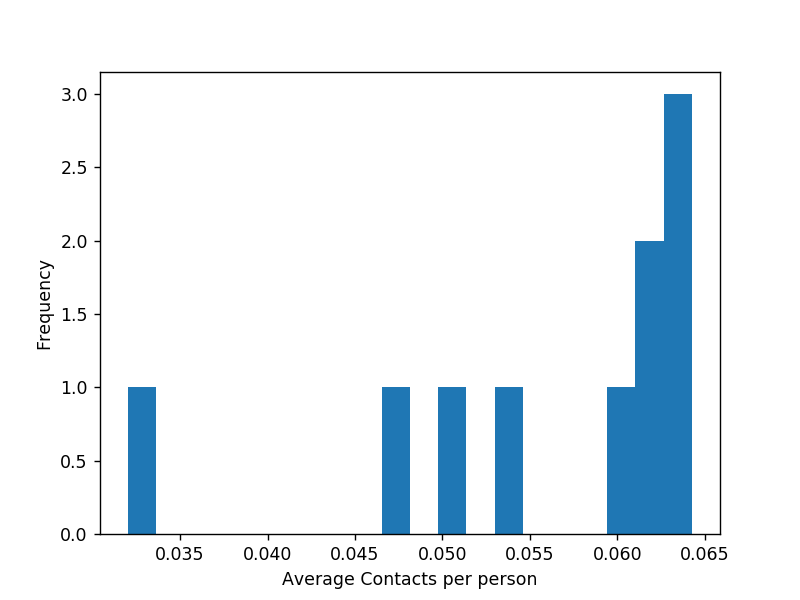

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [339]:
# beta = 0.005

# Step 1
N = 10
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### N = 100

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


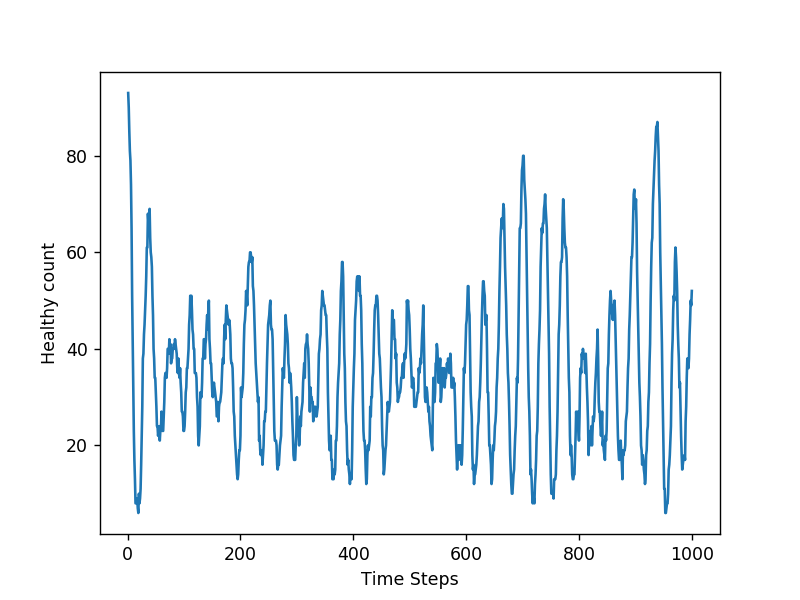

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


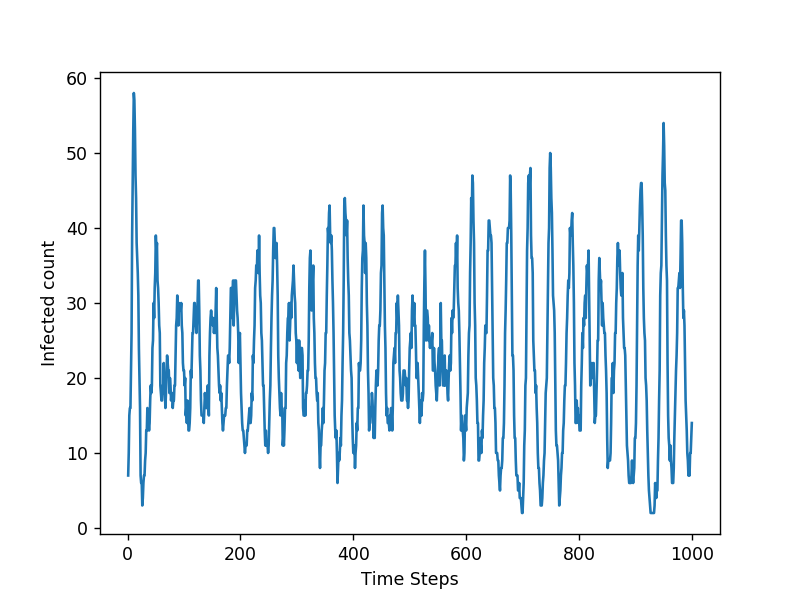

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


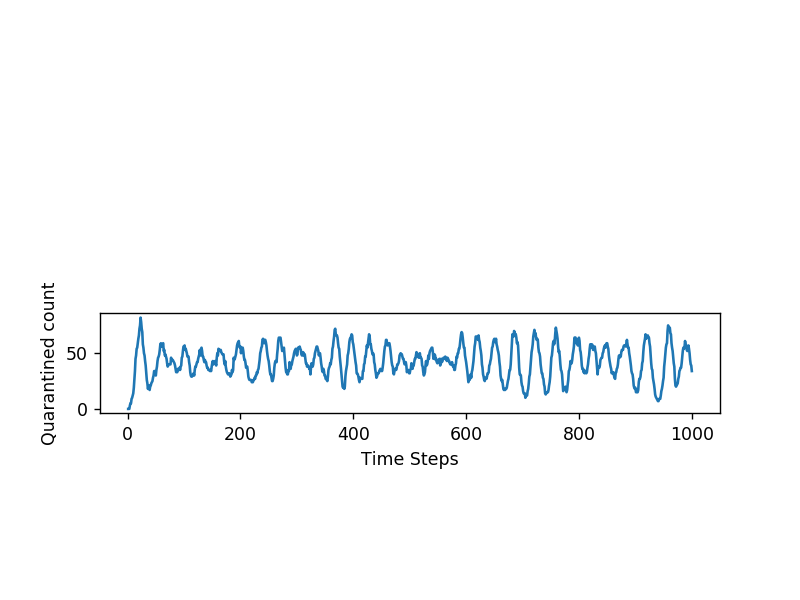

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


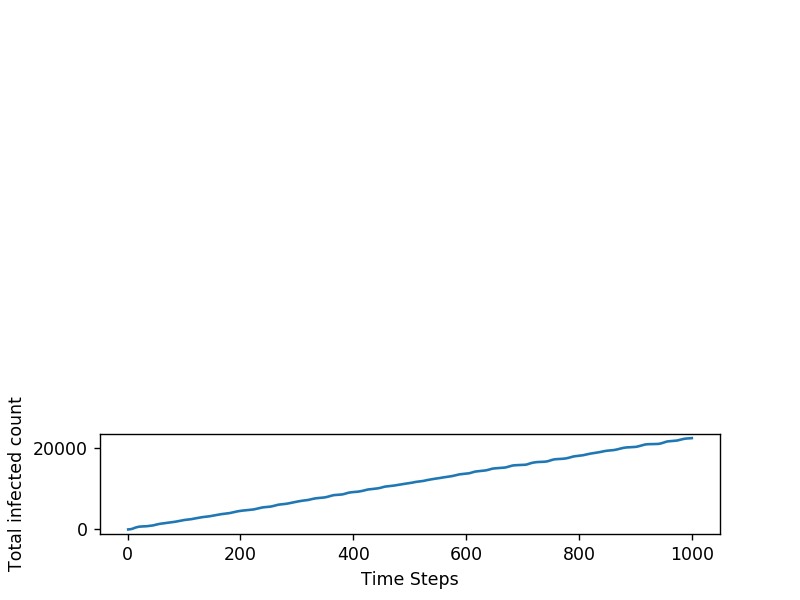

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


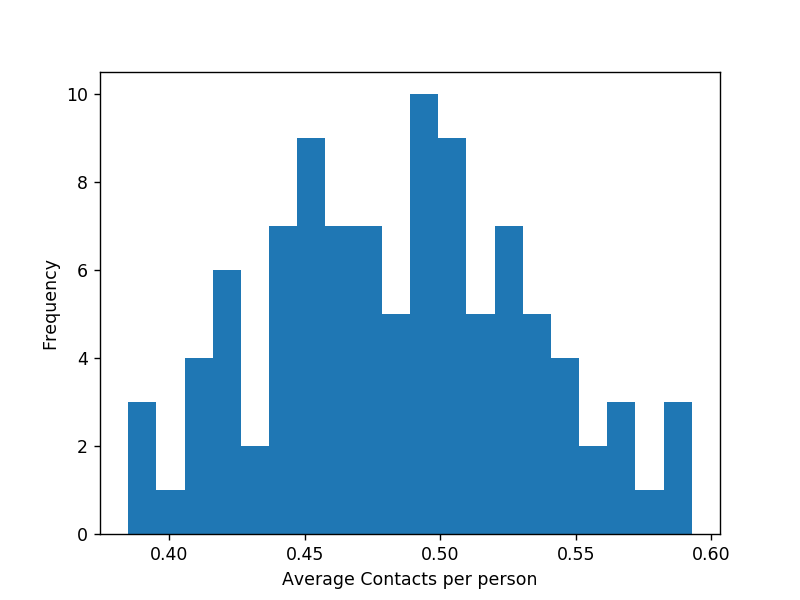

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [340]:
# beta = 0.005

# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### N = 1000

1000


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


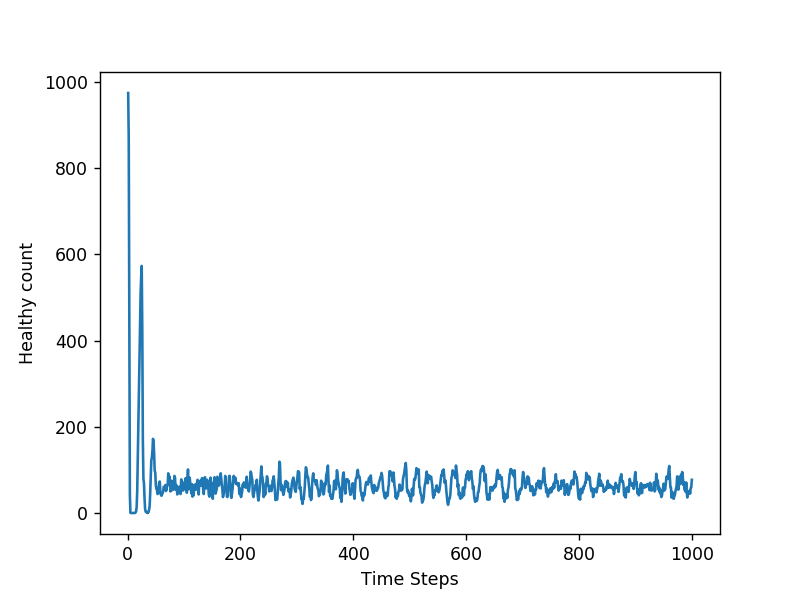

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:116: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


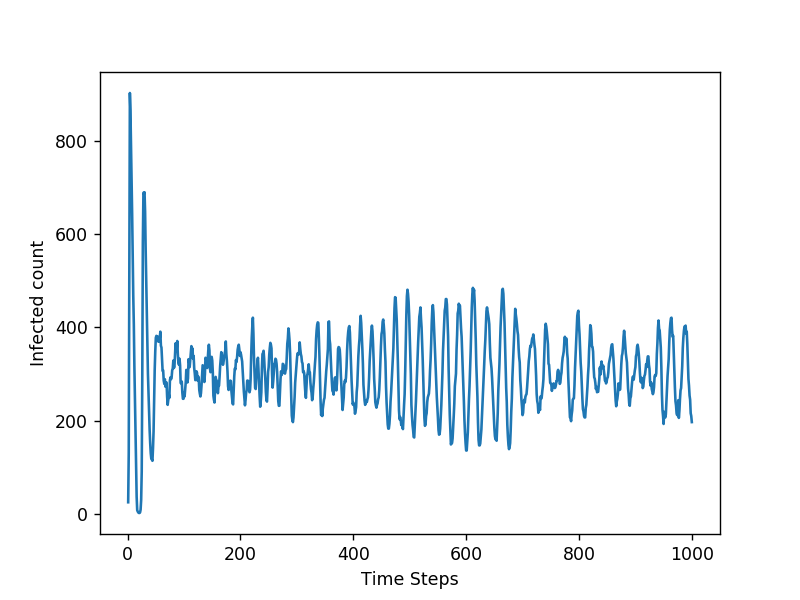

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


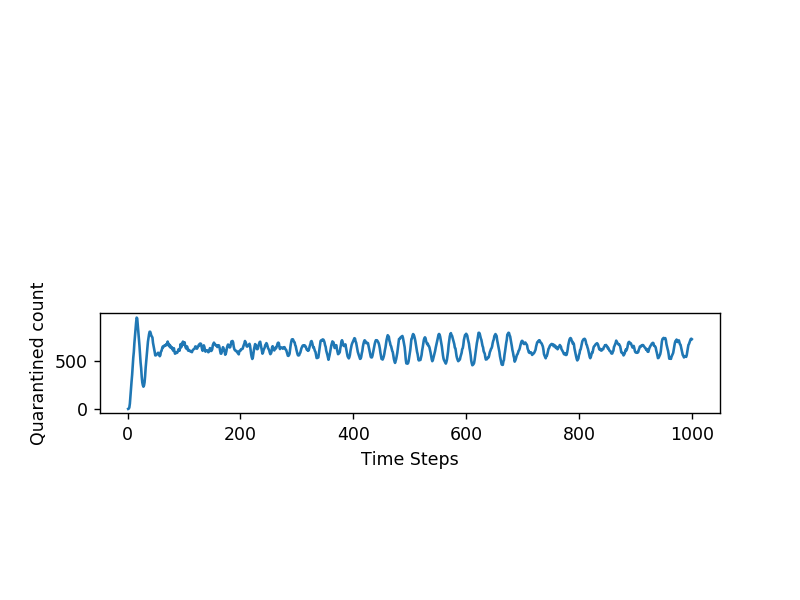

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:128: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


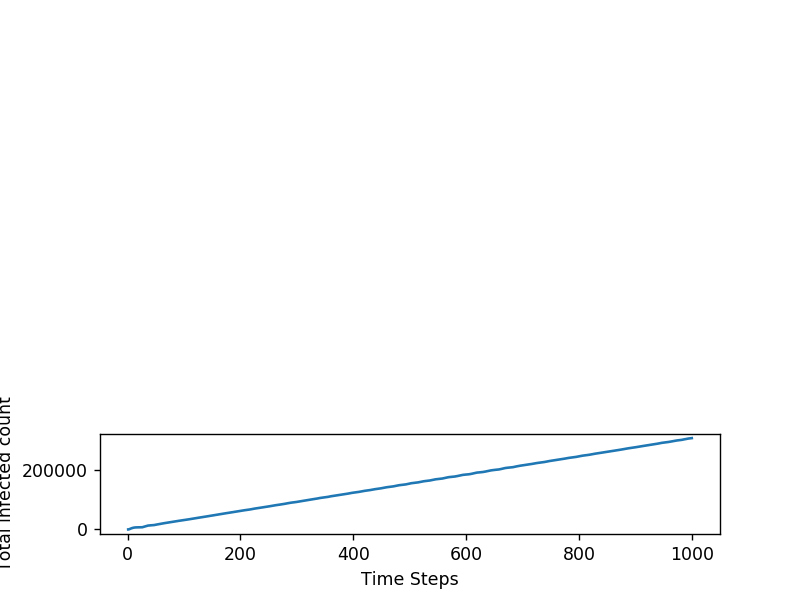

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


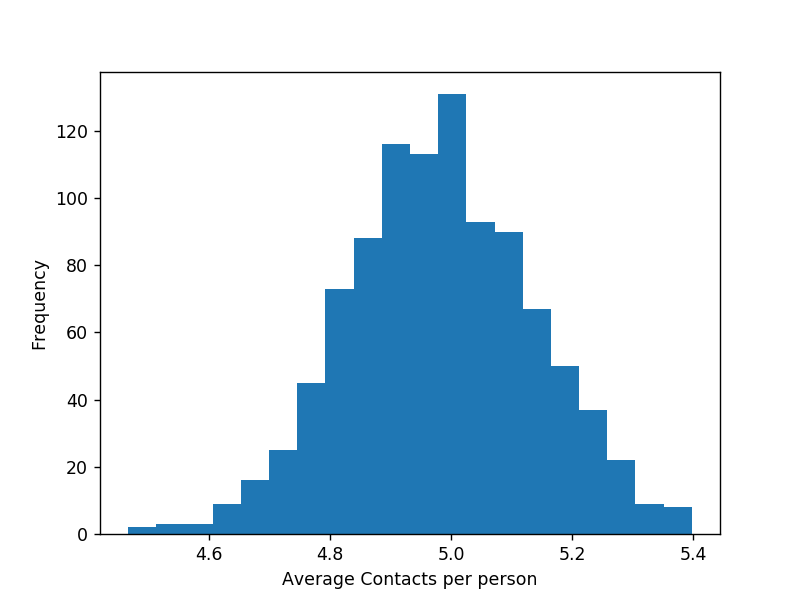

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [206]:
# beta = 0.005

# Step 1
N = 1000
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: As expected systems with small populations (N=10) do not show oscillatory behaviour. But larger populations (N=100 and N=1000), are robust and do show oscillatory behavior.

#### Variable 3: (Initialization) No. of people infected at the beginning <br>

We want to see how our results vary because of varying the initial conditions. So far we have always introduced 5 person initially with the virus (5% of the total population). What happens if we vary that number? Say from 1% to 25% of the total population? Lets see!!! <br>

Note: All other variables are kept constant in this investigation.

##### No. of persons infected initially with the virus = 1

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:106: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


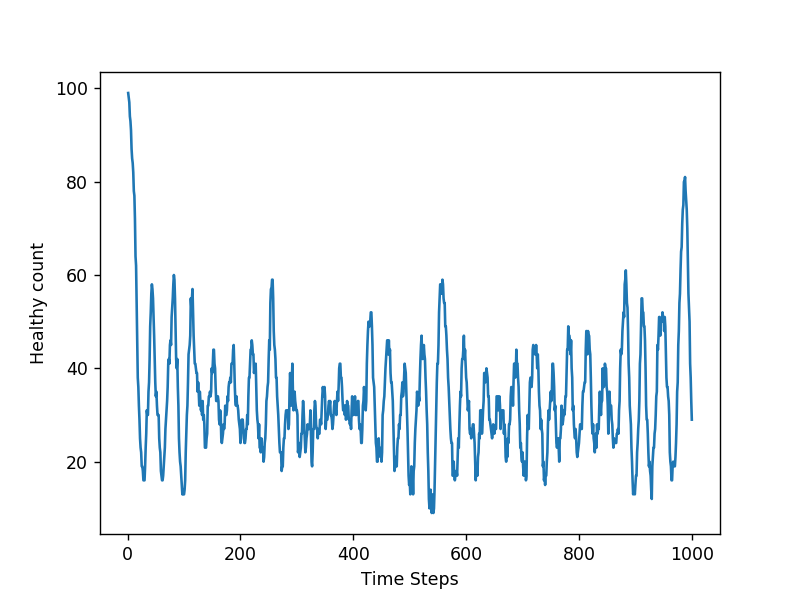

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


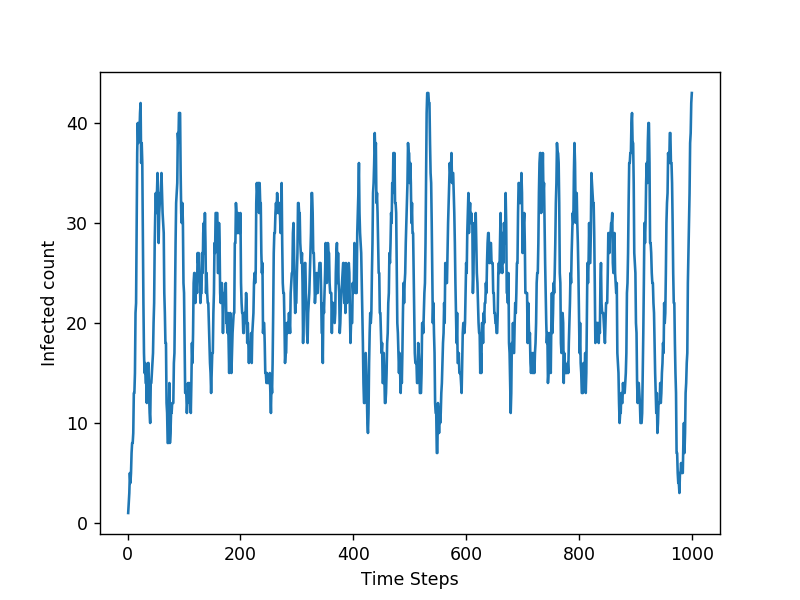

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


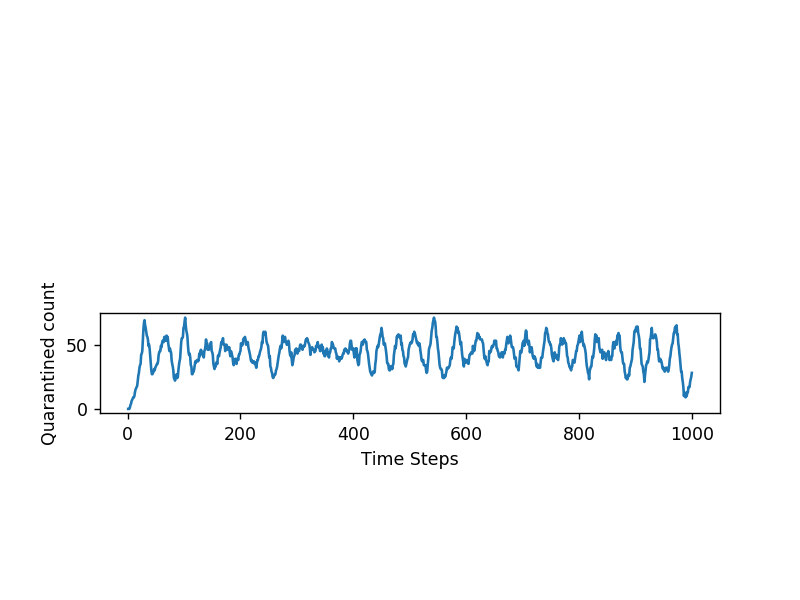

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


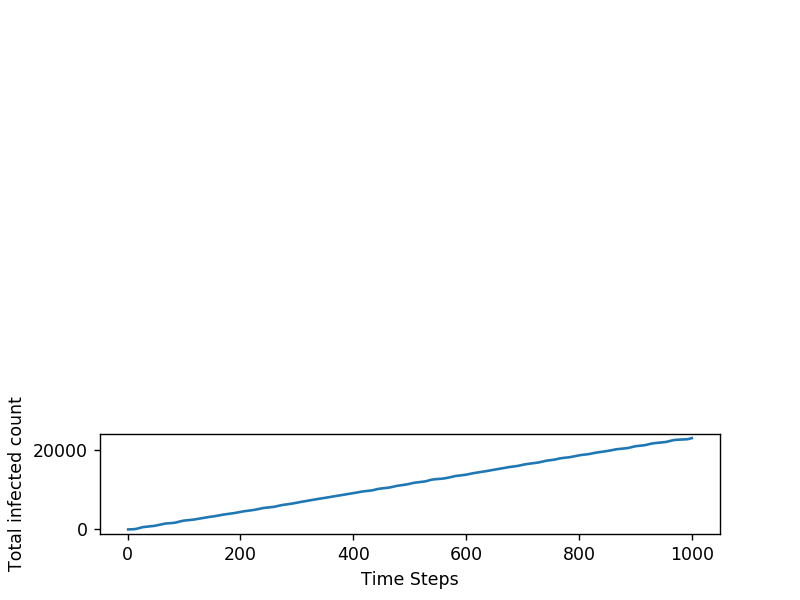

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:131: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


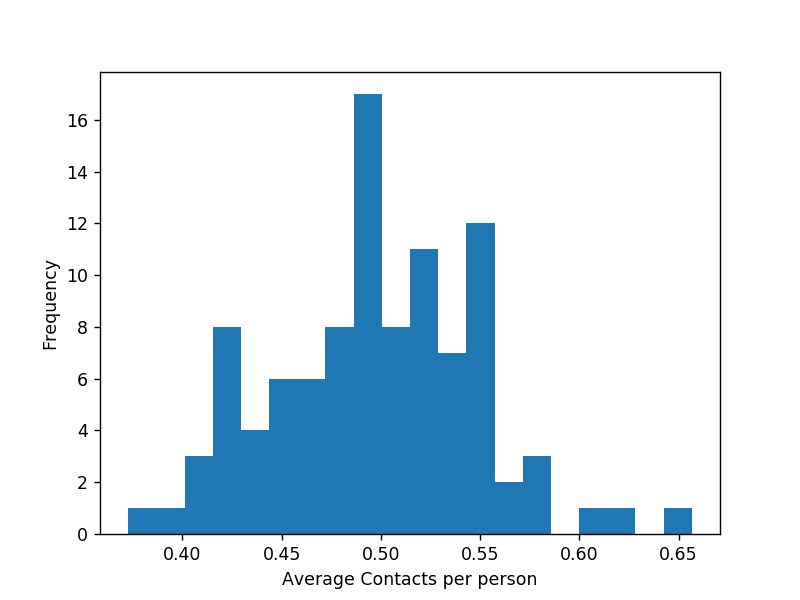

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [336]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 1)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")


##### No. of persons infected initially with the virus = 25

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:106: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


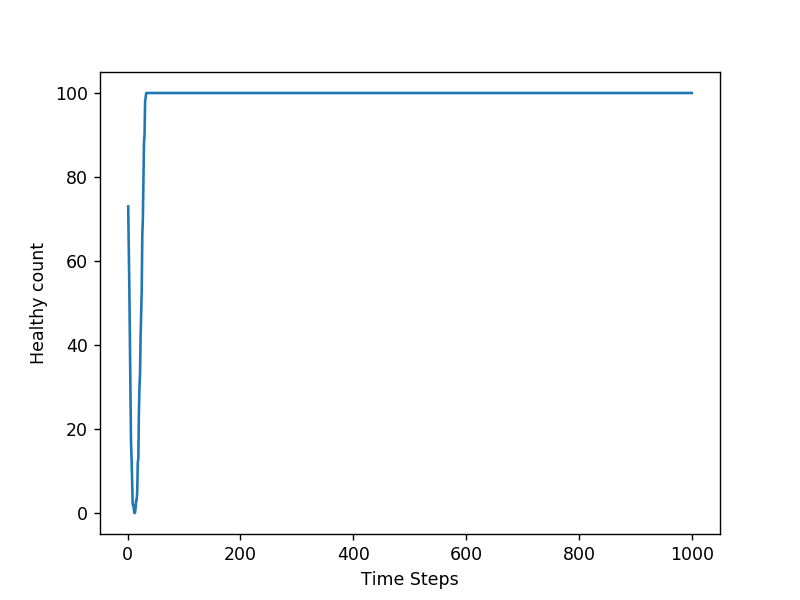

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


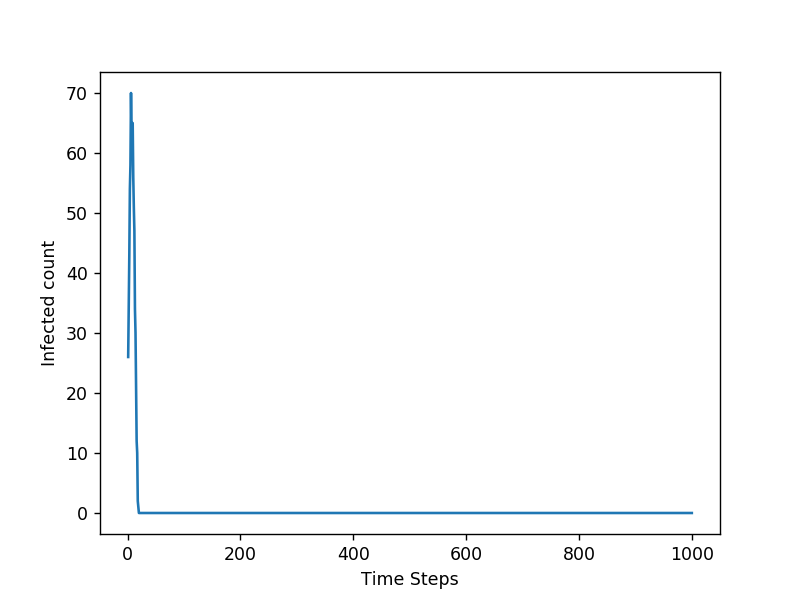

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


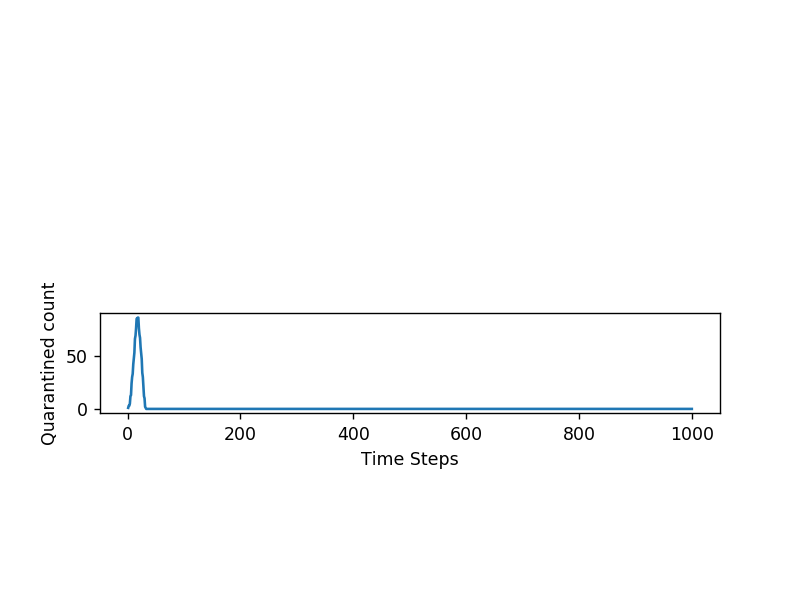

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


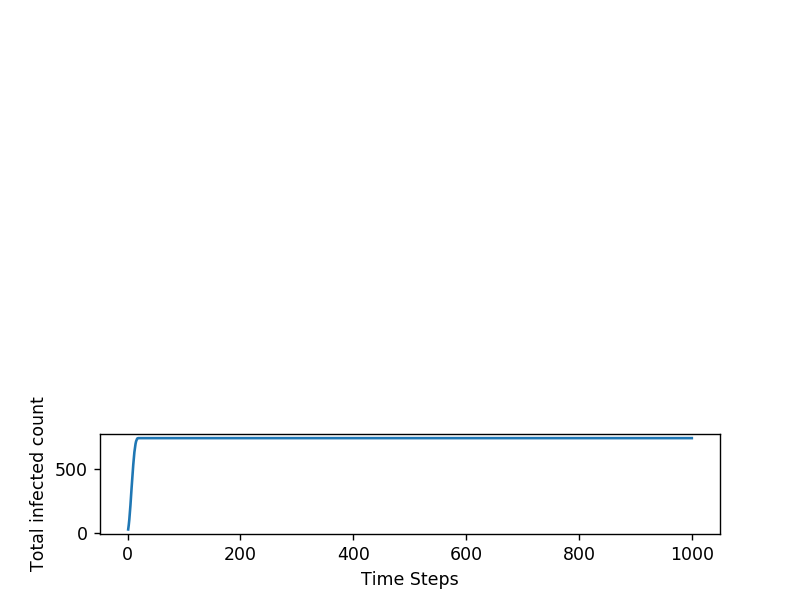

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:131: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


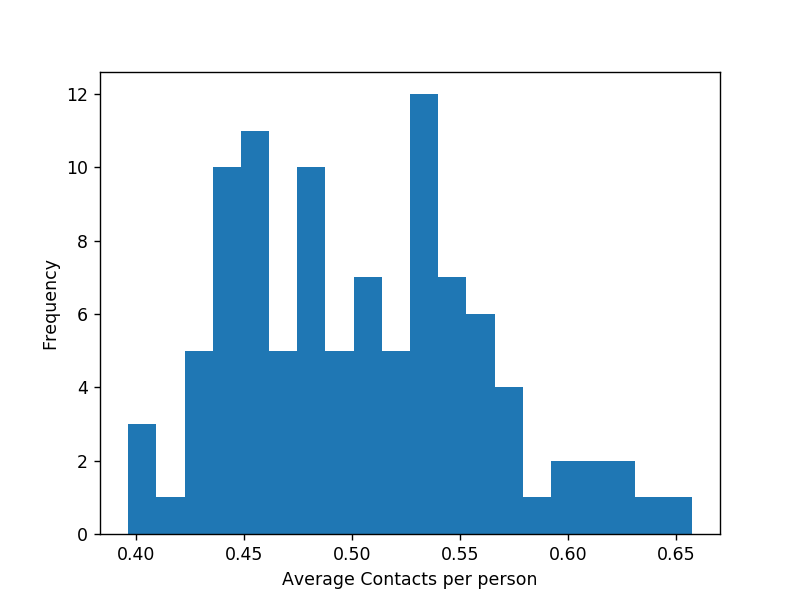

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [334]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 25)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 1000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: At a lower percentage of initially infected people (1%), the system retains oscillatory behaviour. But at higher percentages (25%), almost everyone gets infected with the virus. As a result everyone gets quarantined and the virus disappears soon from the community.

#### Variable 4: Timesteps <br>

Time is not a system variable. But we want to see if given enough time, can the oscillation go away? <br>

Note: All other variables are kept constant in this investigation.

##### Time steps = 10000

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


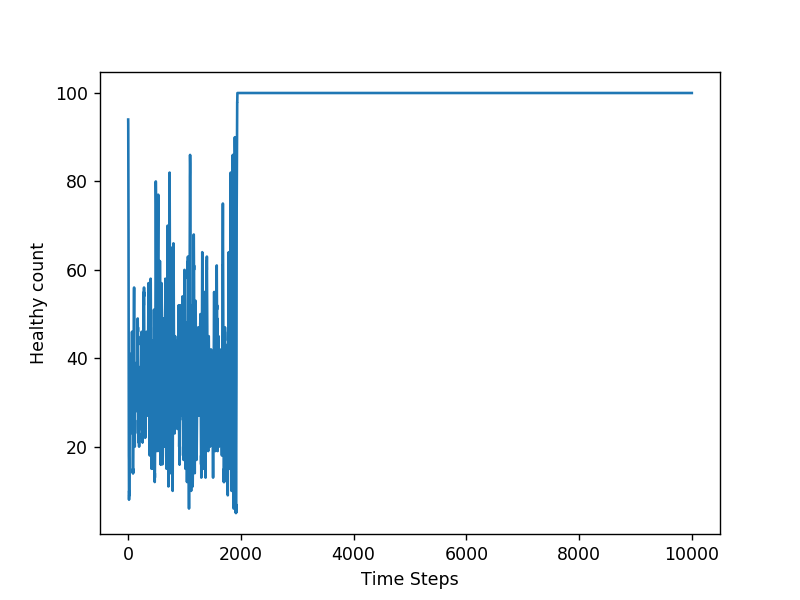

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


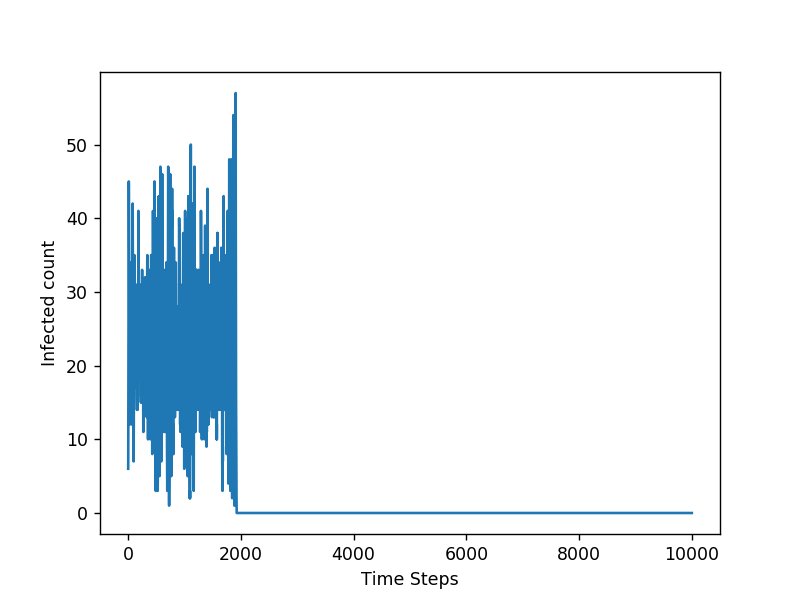

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


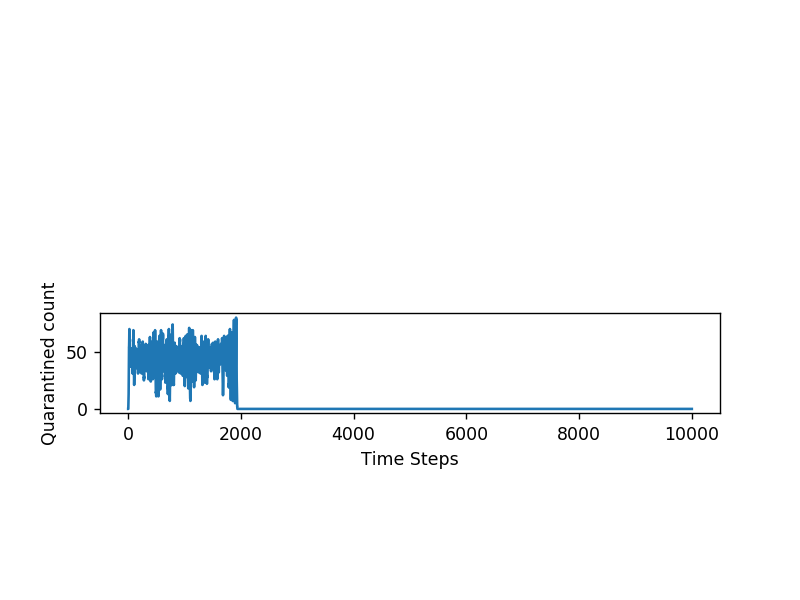

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


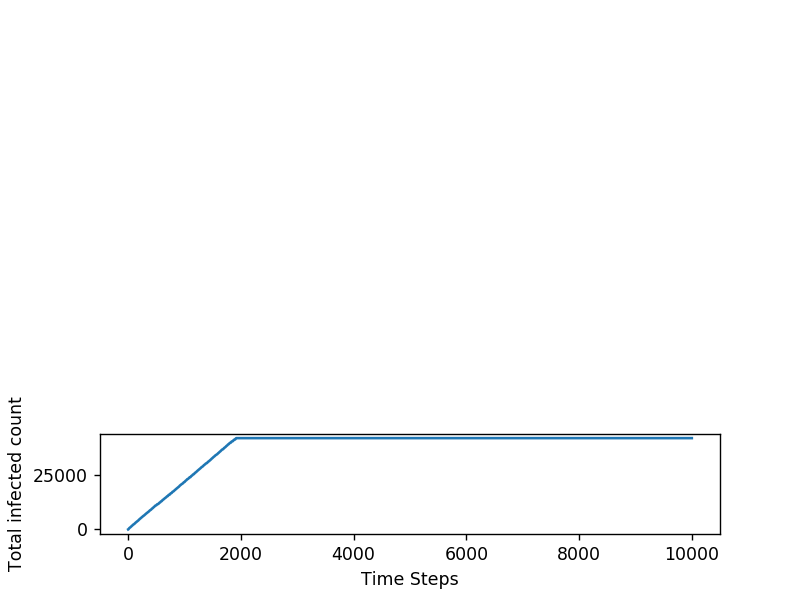

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


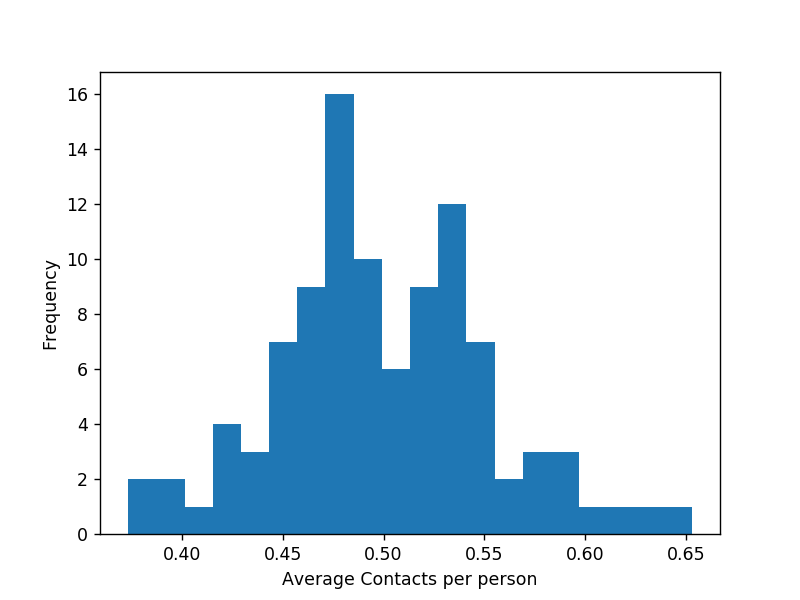

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [221]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 10000

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analaysis: Yes, given enough time steps, the oscillation will go away. But we dont know when exactly such a thing happens. It is spontaneous and probabilistic.

#### Variable 5: Quarantine Period <br>

Quarantine is our favorite word when it comes to highly contagious diseases. But how effective it really is? Lets put it to 
test. We initially assumed the quarantine period to be 14 days but what happens if we vary it? We will vary it from 7 days to 28 days. <br>

Note: All other variables are kept constant in this investigation.

##### Quarantine period = 7 days

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


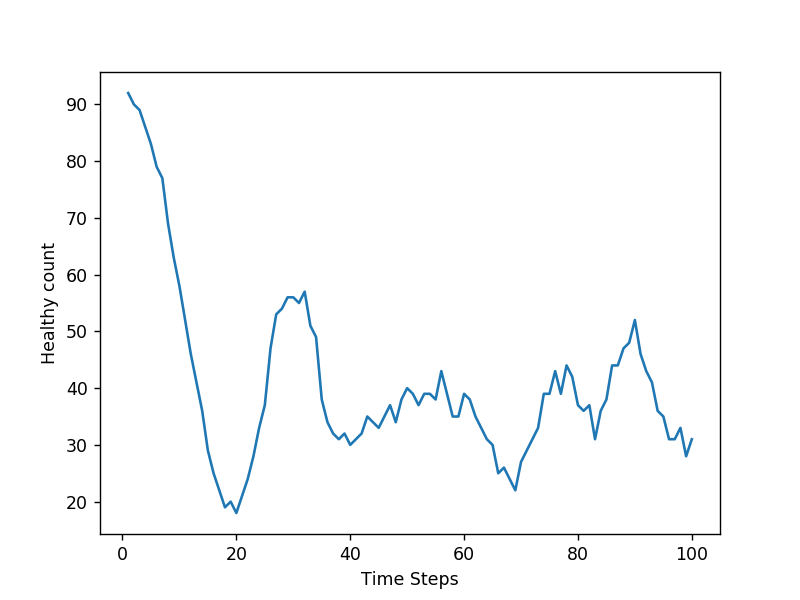

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


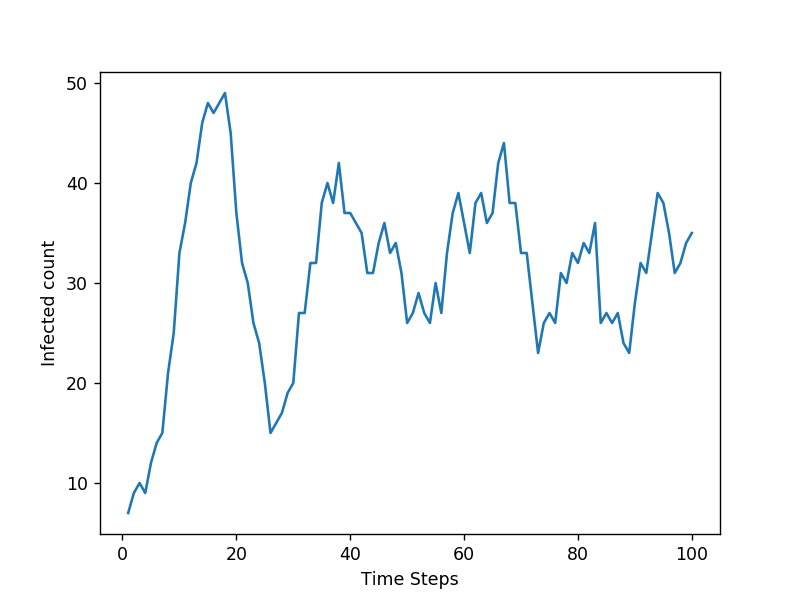

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


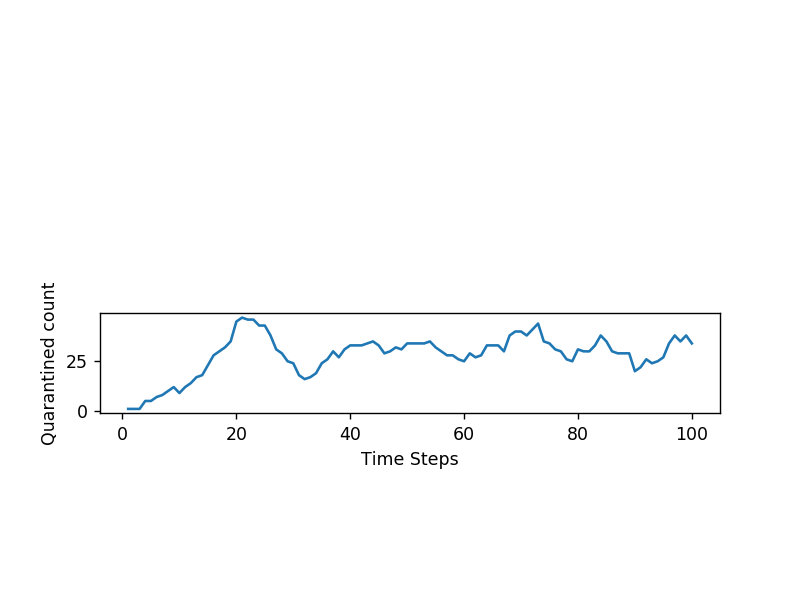

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


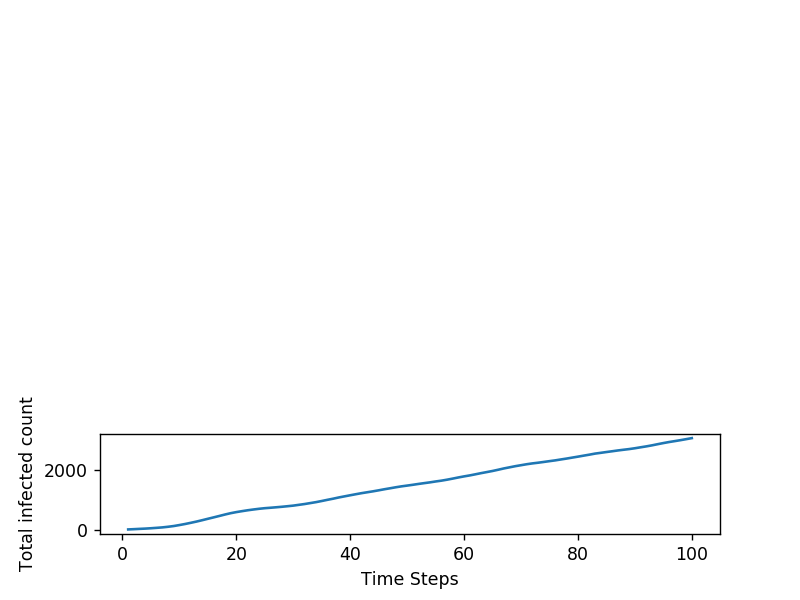

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


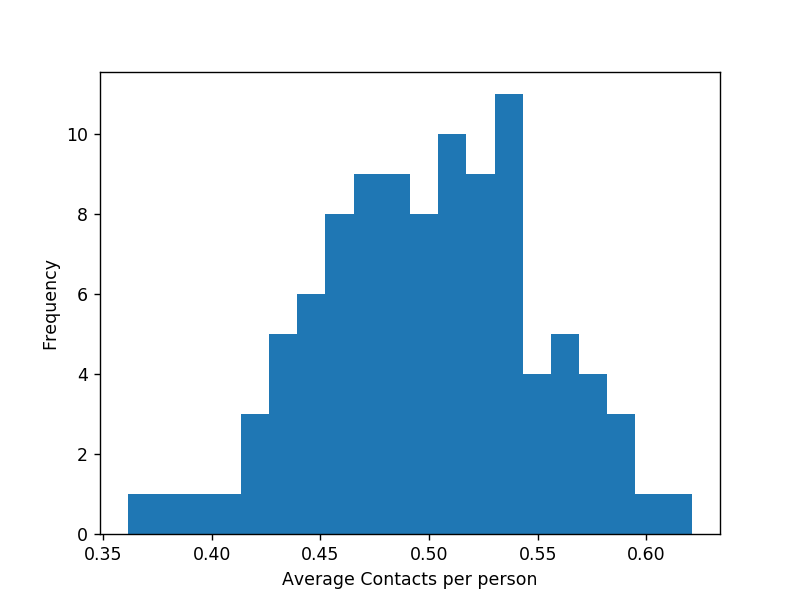

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [222]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### Quarantine period = 14 days

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


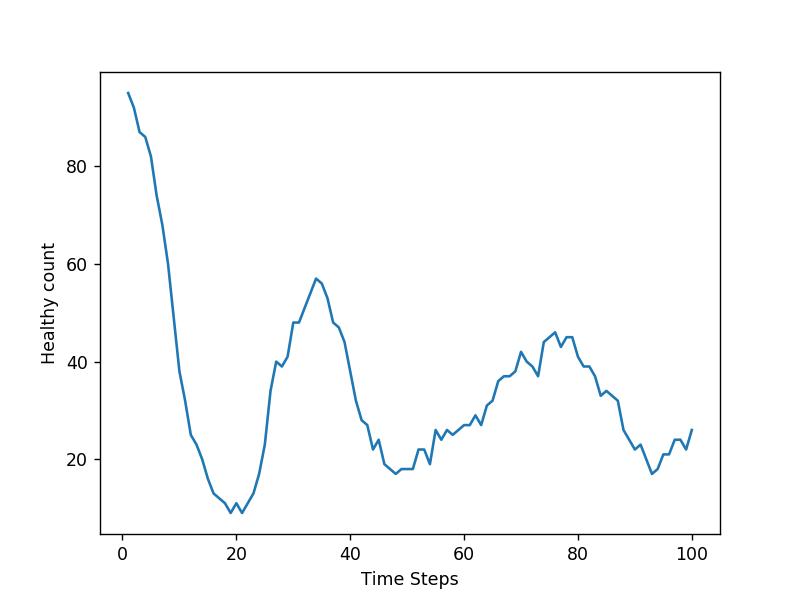

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


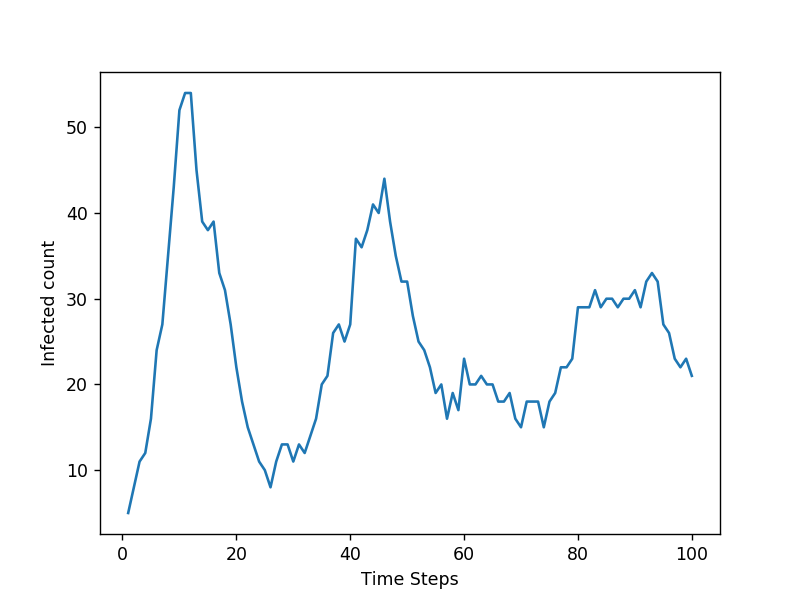

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


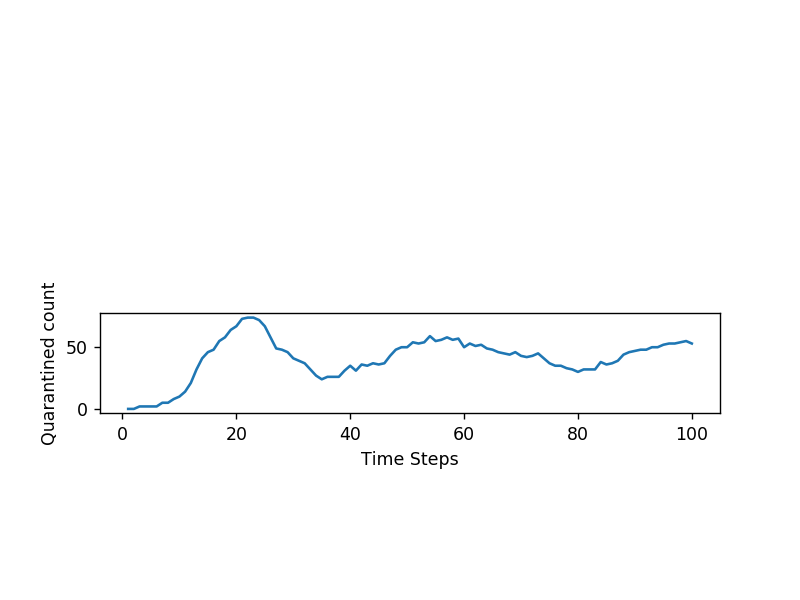

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


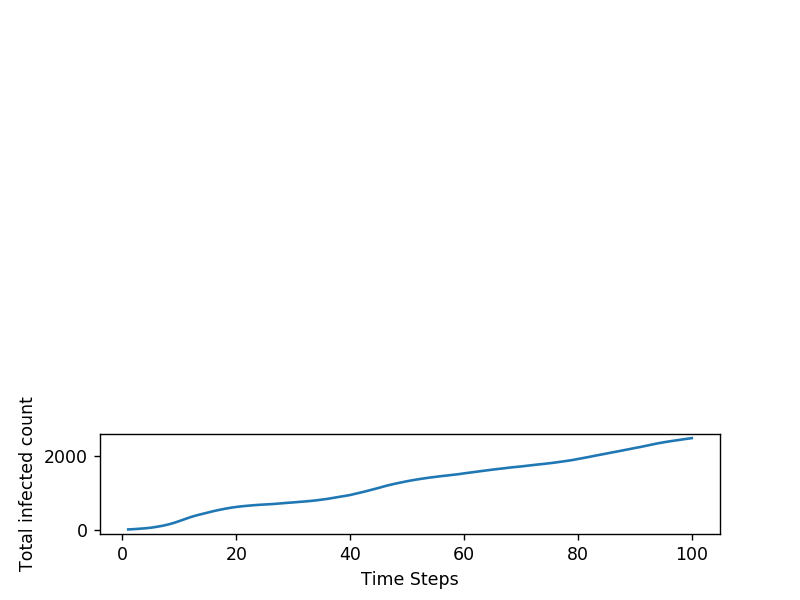

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


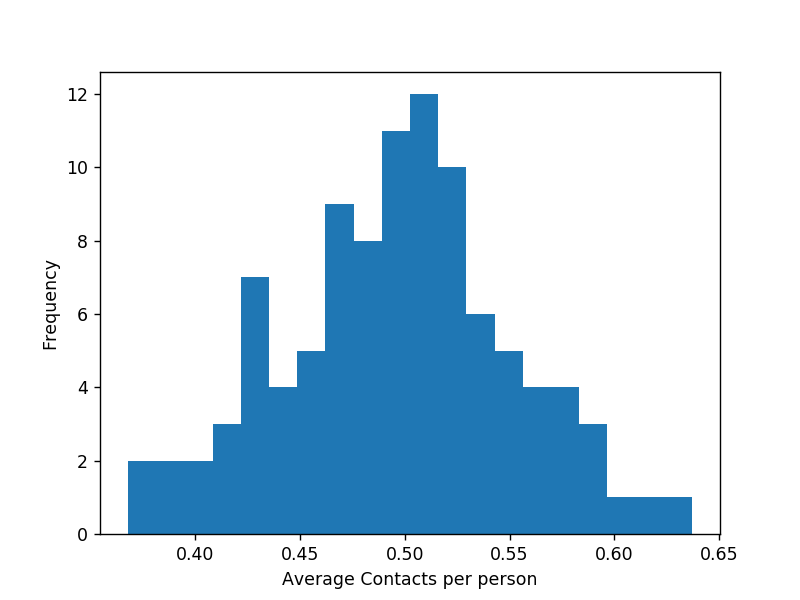

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [224]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### Quarantine period = 21 days

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


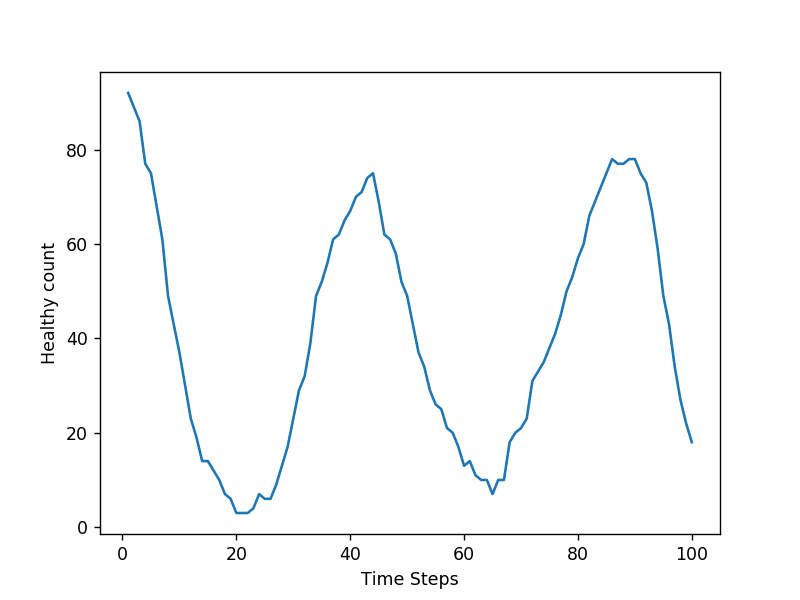

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


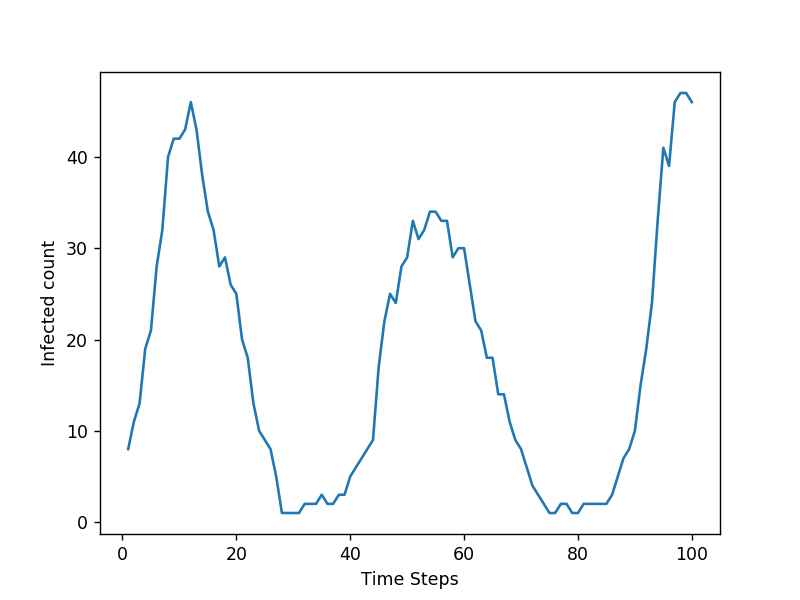

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


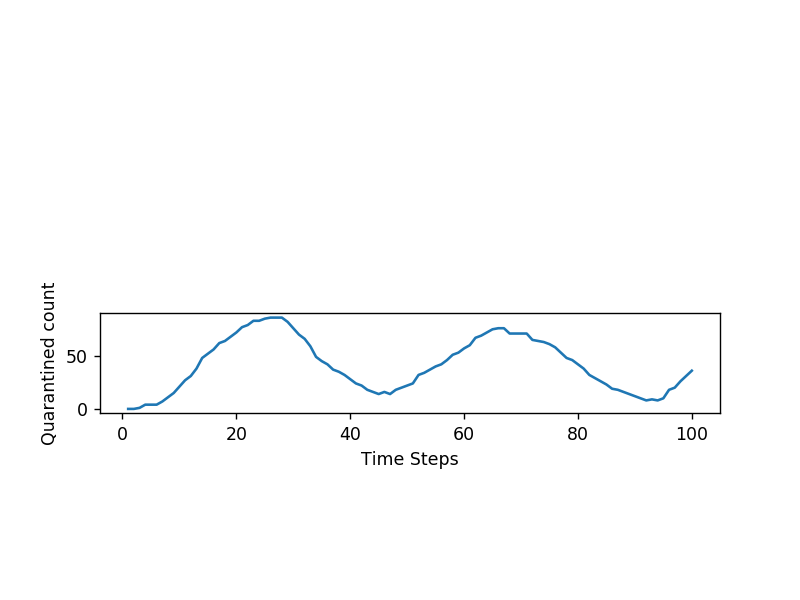

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


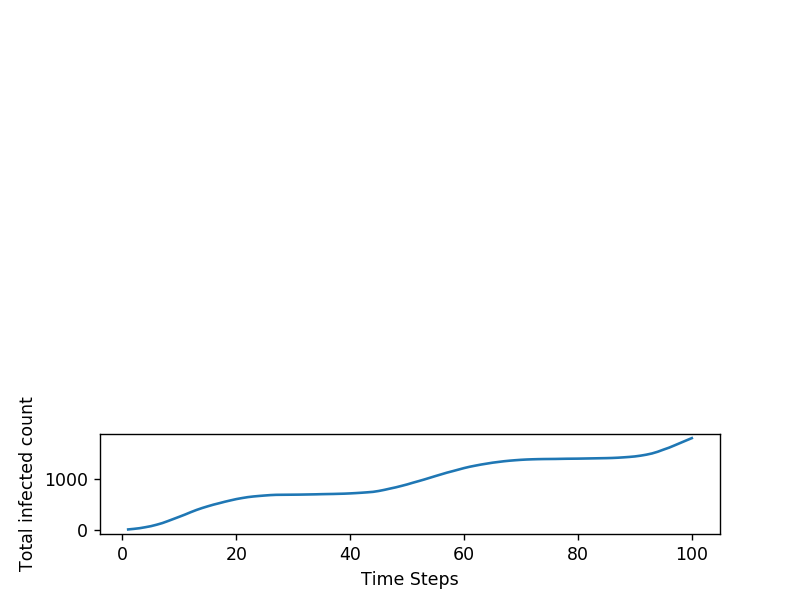

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


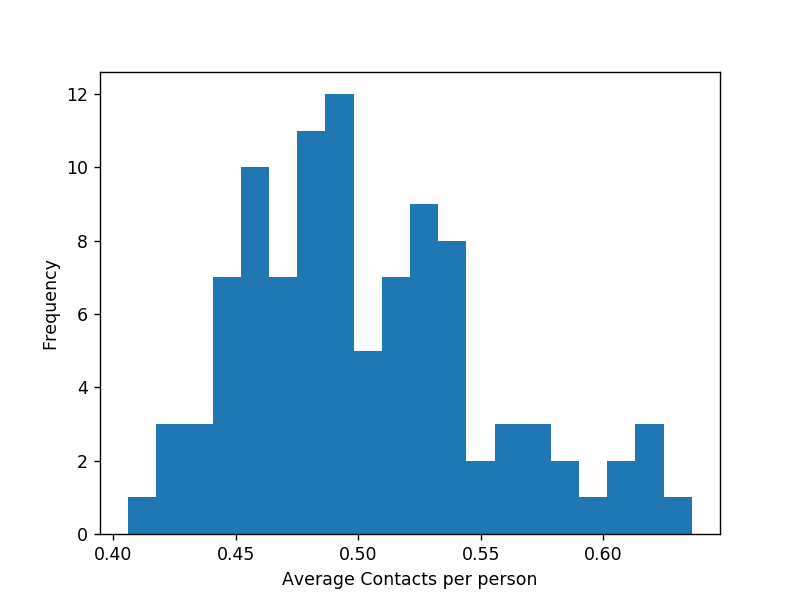

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [225]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 21:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### Quarantine period = 28 days

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


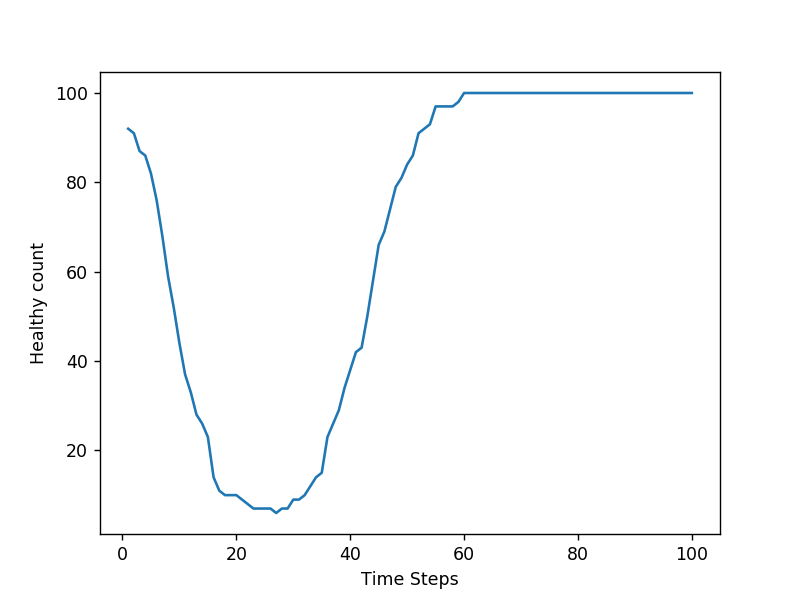

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


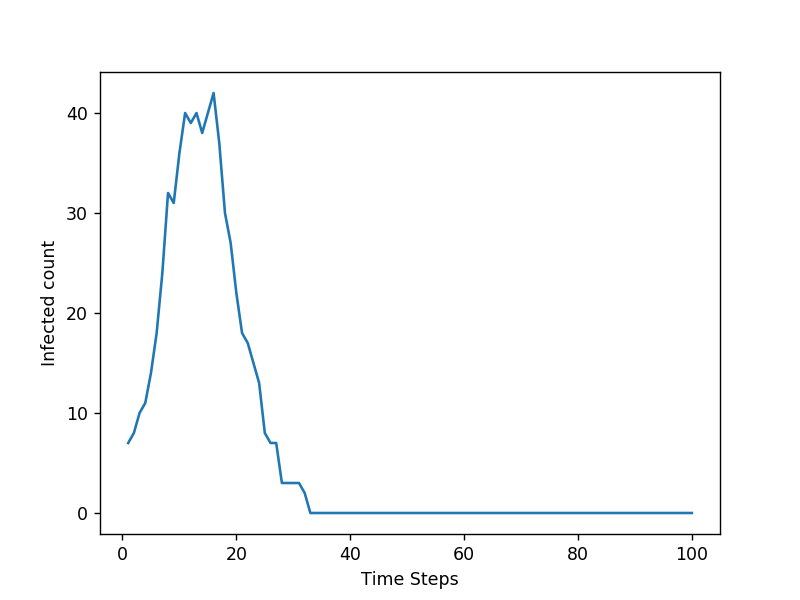

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


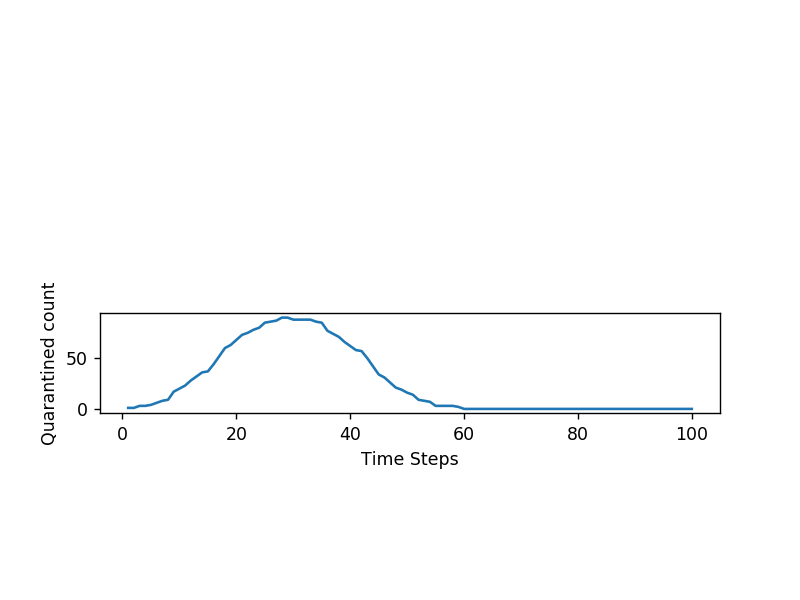

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


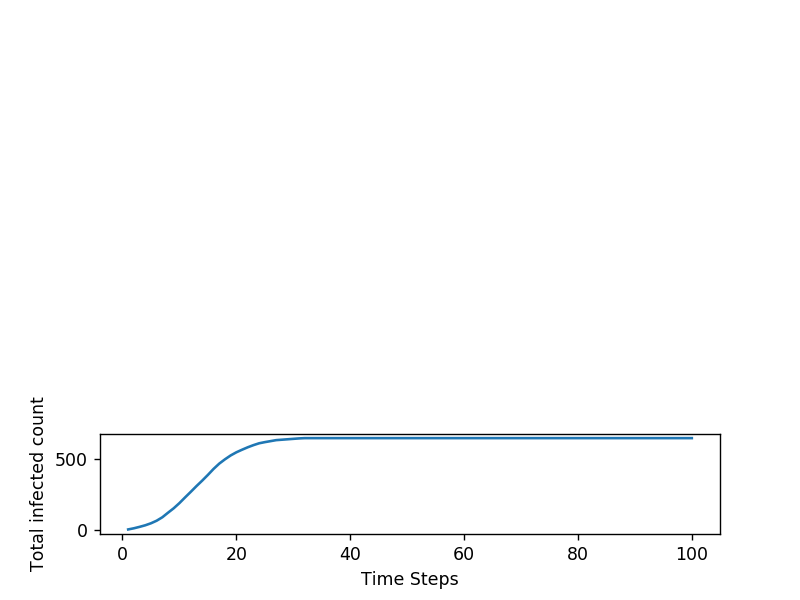

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


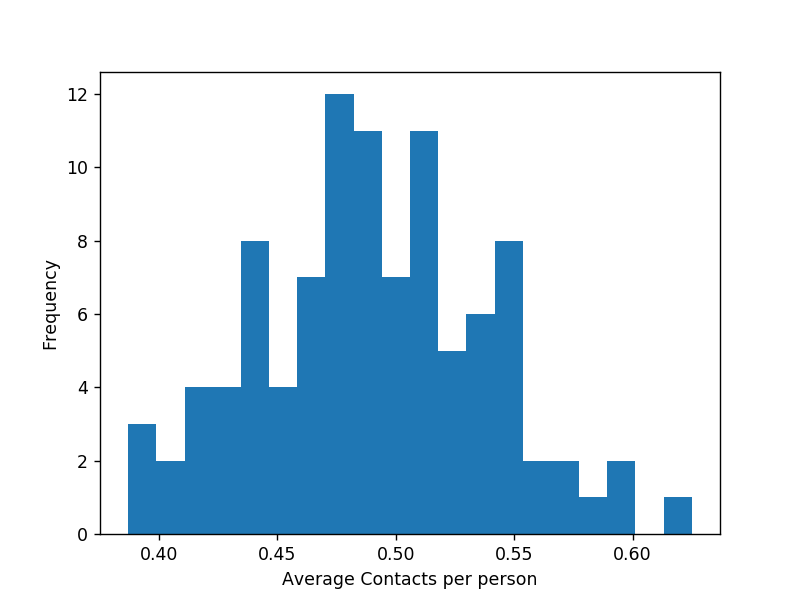

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [226]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 28:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: At low quarantine numbers (7-21), the shape of the curves and numbers are similar. But at very high quarantine numbers (like 28), almost everyone gets quarantined at the same time at some point. This means the virus can no longer spread, and eventually disappears from the population. So in a nutshell, quarantine does help in stopping the spread of the virus.

#### Variable 6: Incubation Count <br>

We defined incubation count as the time before a person shows symptoms, and are eventually quarantined. We assumed the incubation period for COVID-19 to be between 2 and 14 days. The distribution is also assumed to be constant. These assumptions may or may not accurately describe reality. So we need to put them to test. We will try a couple of scenarios: <br>
(1) Scenario 1: Constant distribution between 2 and 14 <br>
(2) Scenario 2(a): A fixed number of days = 5 (Median: 5.1, mean: 5.5) <br>
(3) Scenario 2(b): A fixed number of days = 12 (For 97.5 % of people symptoms appear after 11.5 days) <br> 
(4) Scenario 4: A normal distibution with mean 5.5 and standard deviation 1.1 <br>

Source: https://www.jwatch.org/na51083/2020/03/13/covid-19-incubation-period-update

Note: All other variables are kept constant in this investigation.

##### Scenario 1: Constant distribution between 2 and 14

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


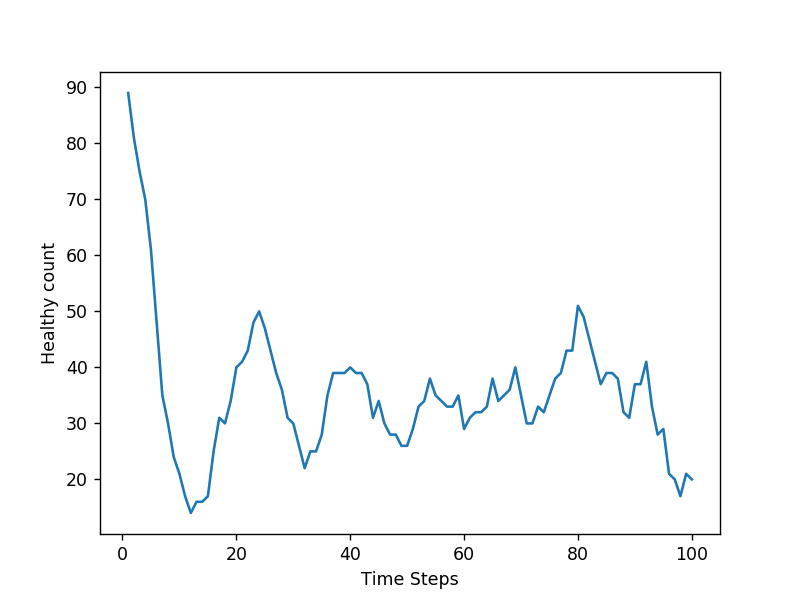

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


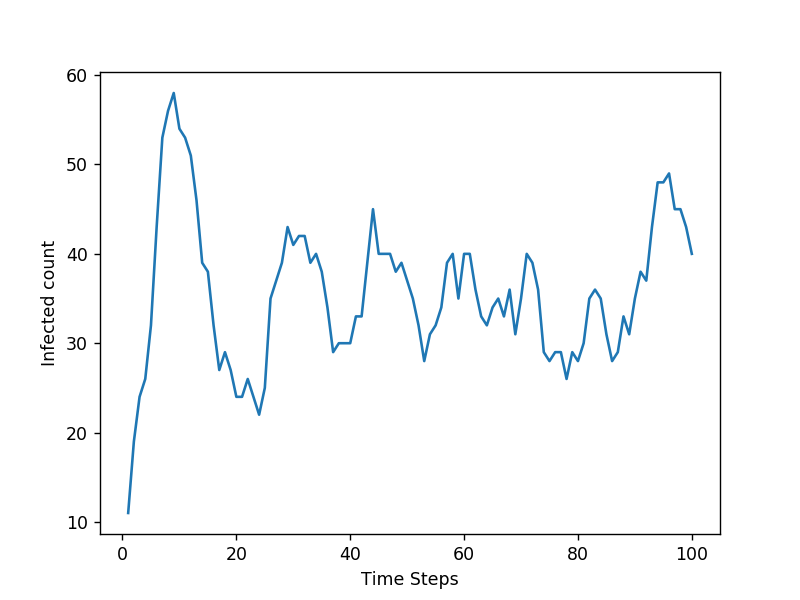

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


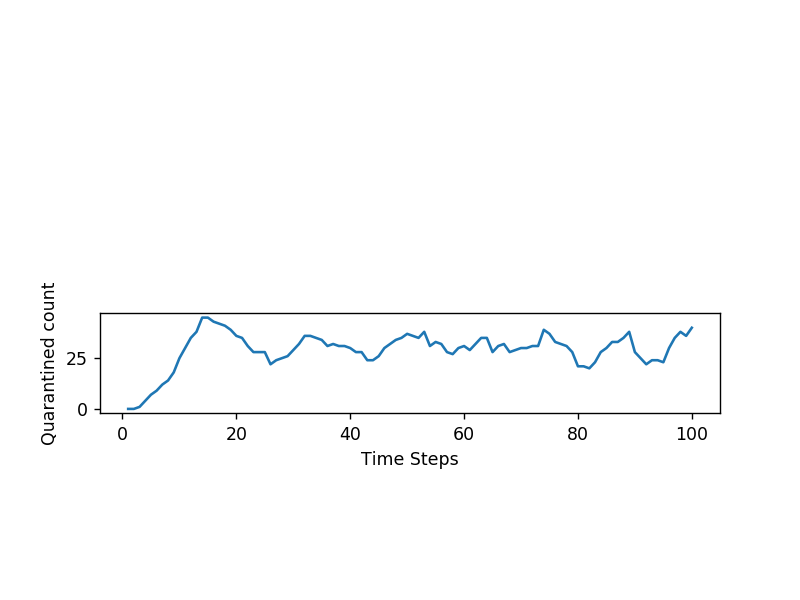

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


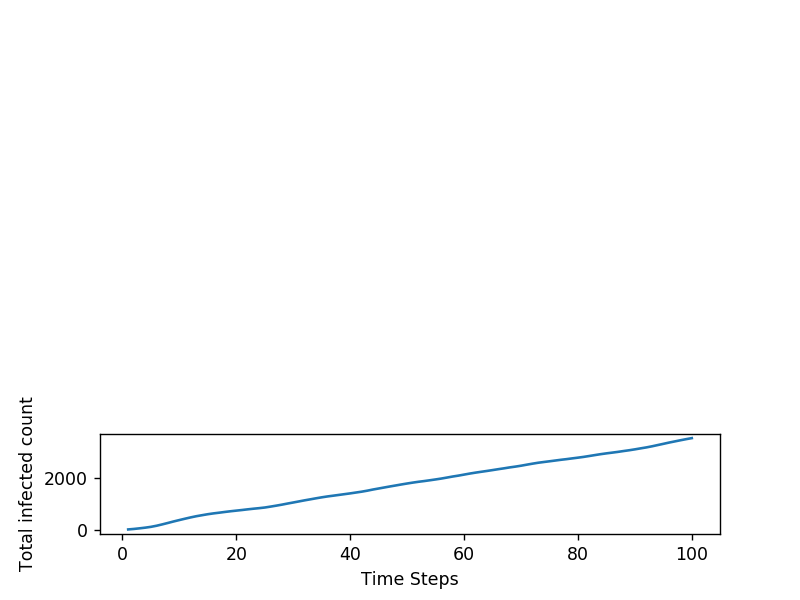

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


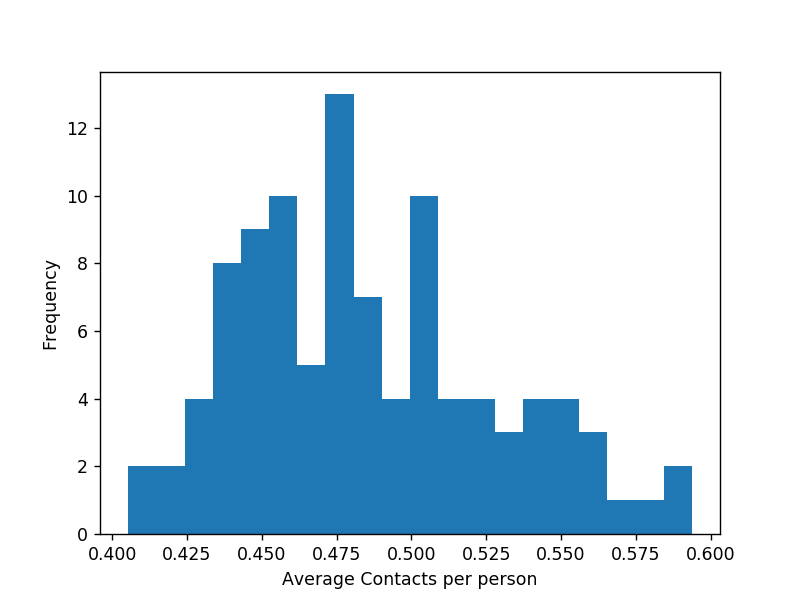

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [227]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### Scenario 2(a): A fixed number of days = 5 

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:106: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


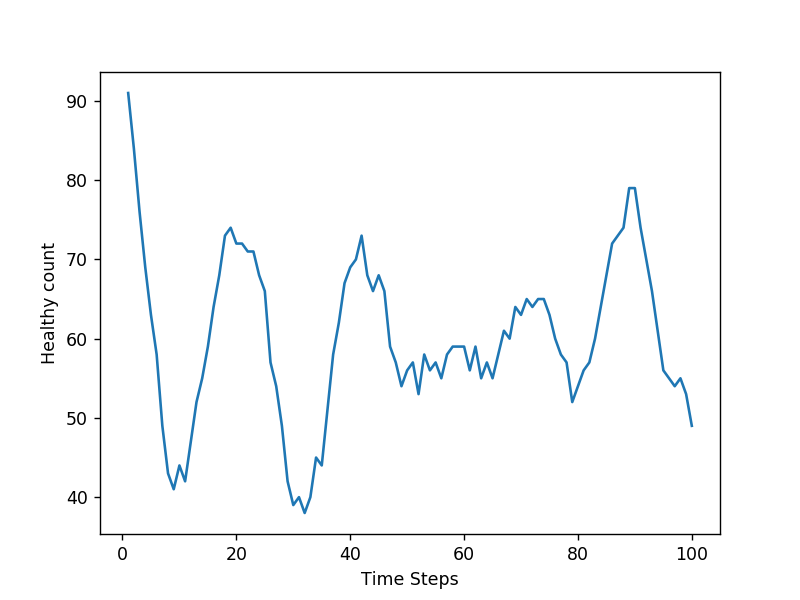

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


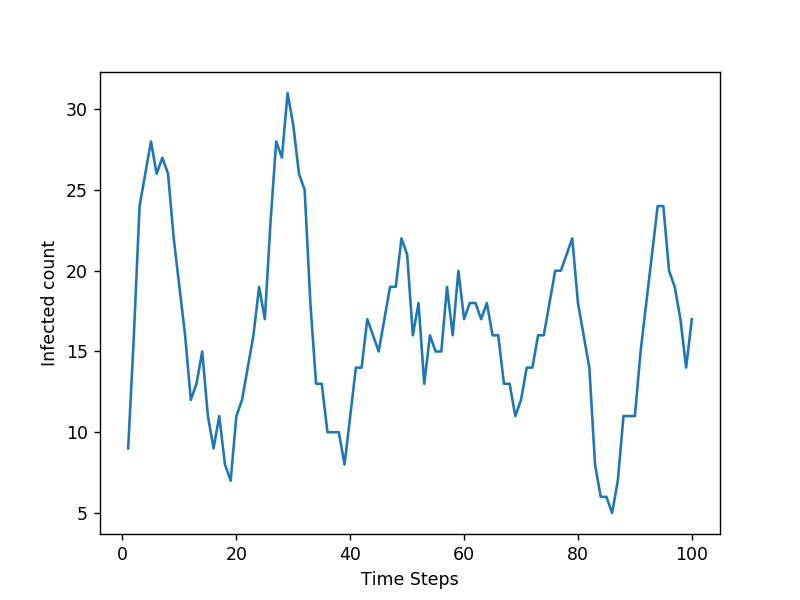

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


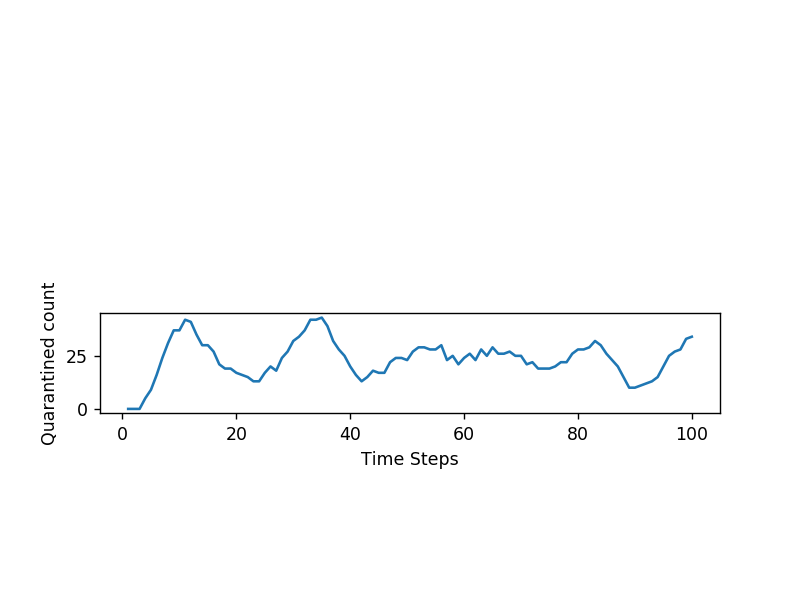

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


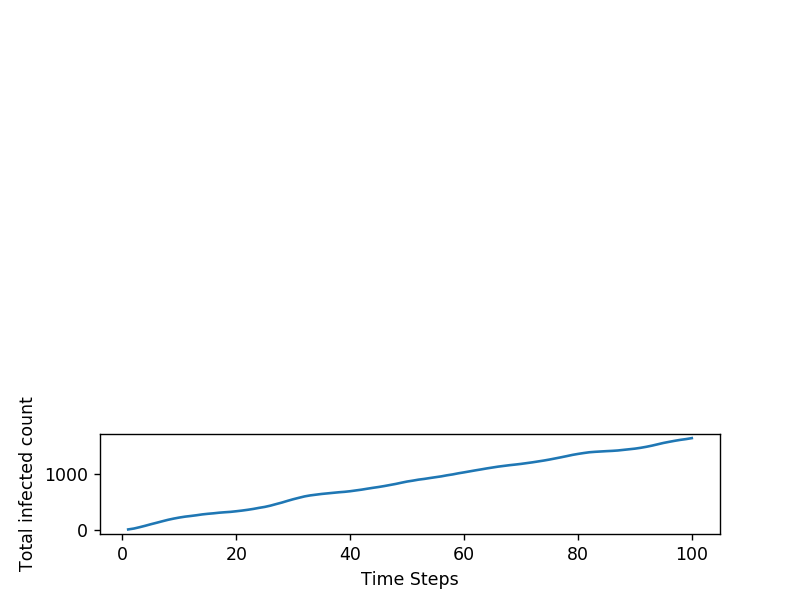

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:131: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


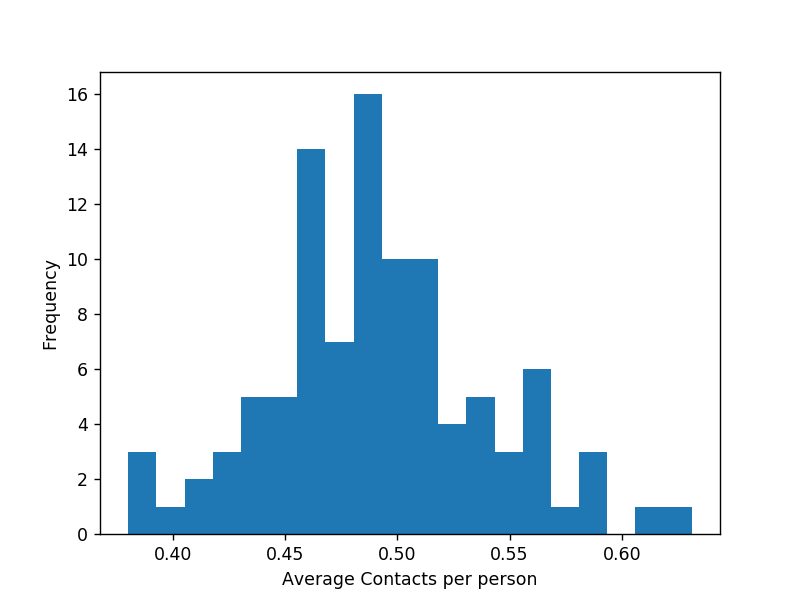

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [230]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = 5

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### (3) Scenario 2(b): A fixed number of days = 12 

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:106: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


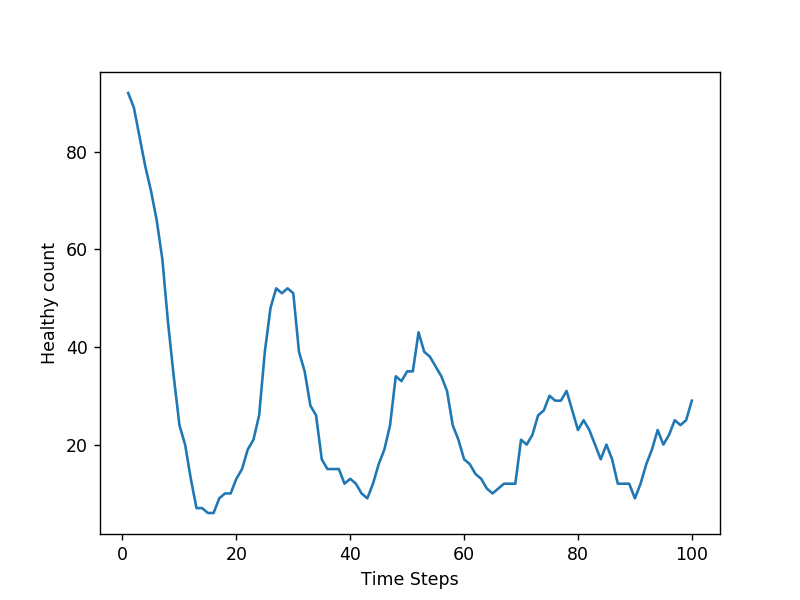

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


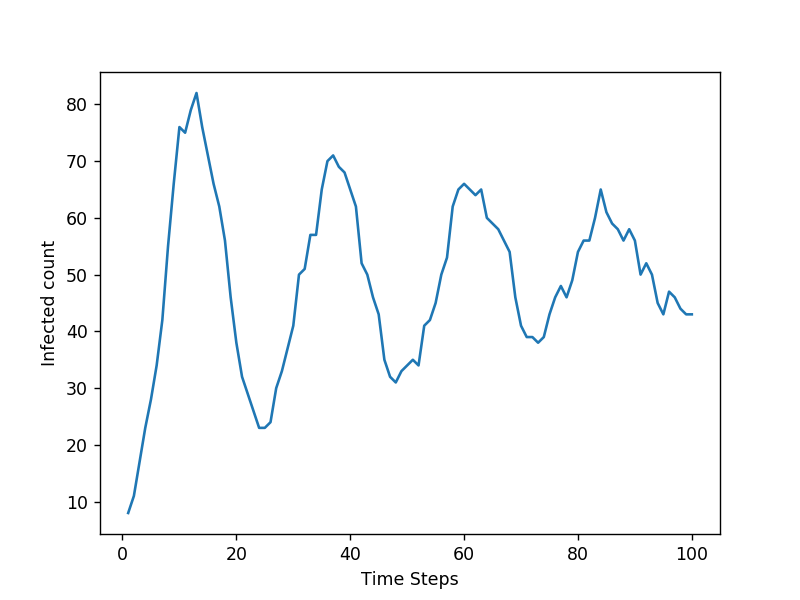

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


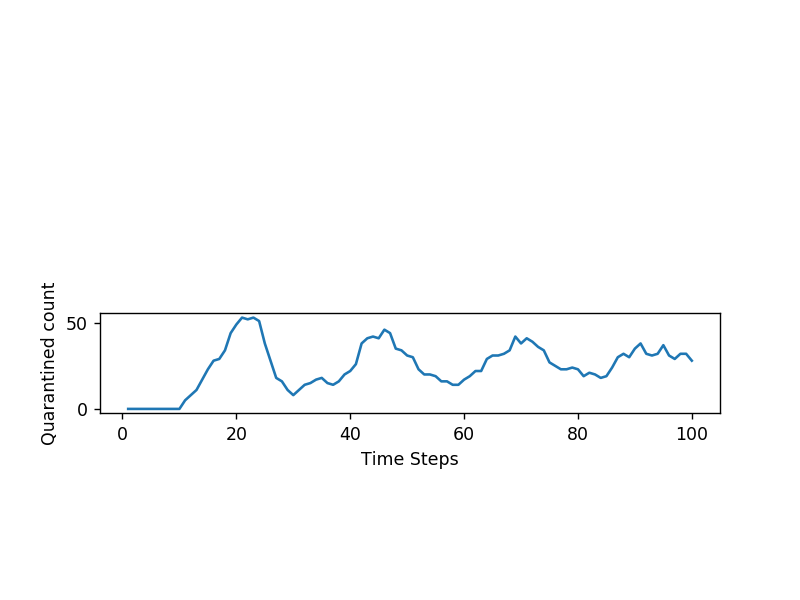

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


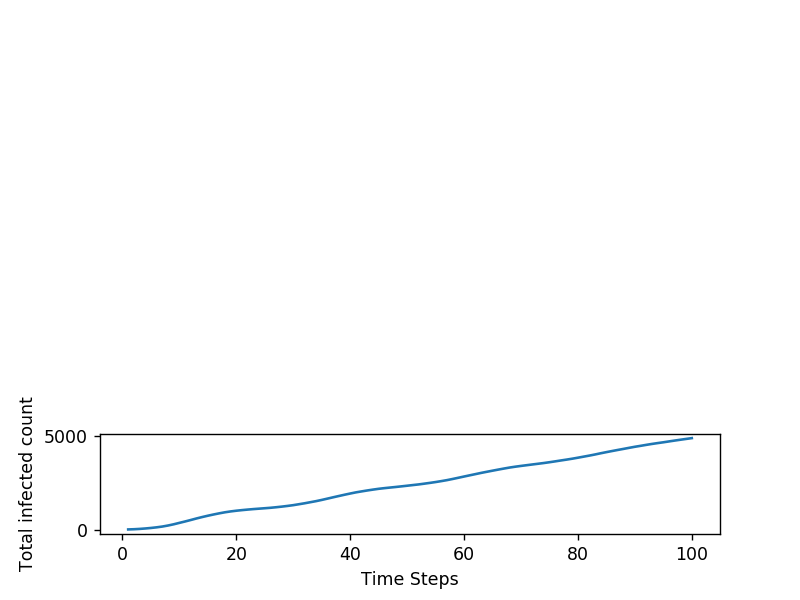

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:131: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


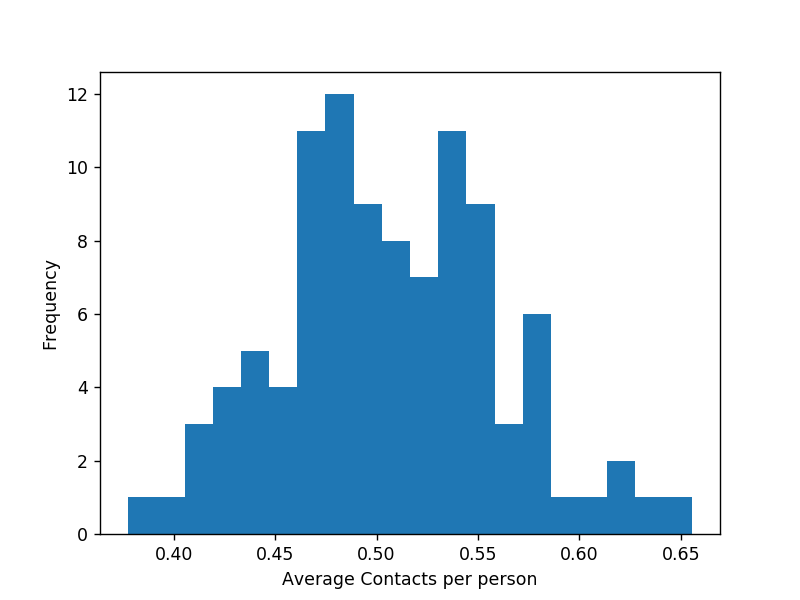

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [233]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = 12

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### Scenario 3: A normal distibution with mean 5.1 and standard deviation 1.1

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


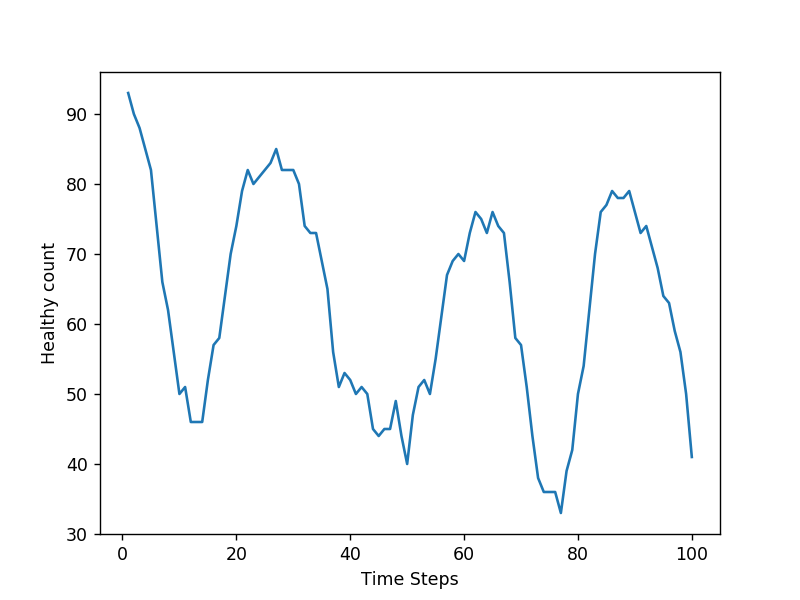

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


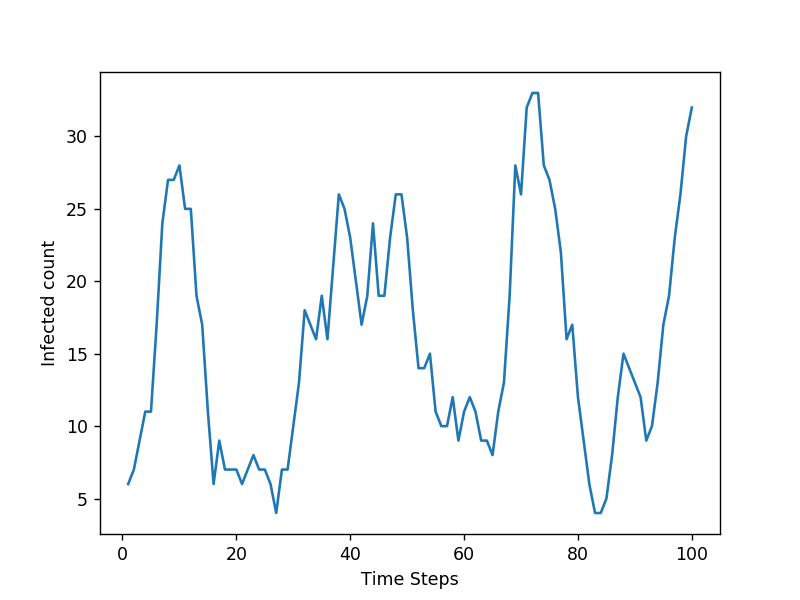

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


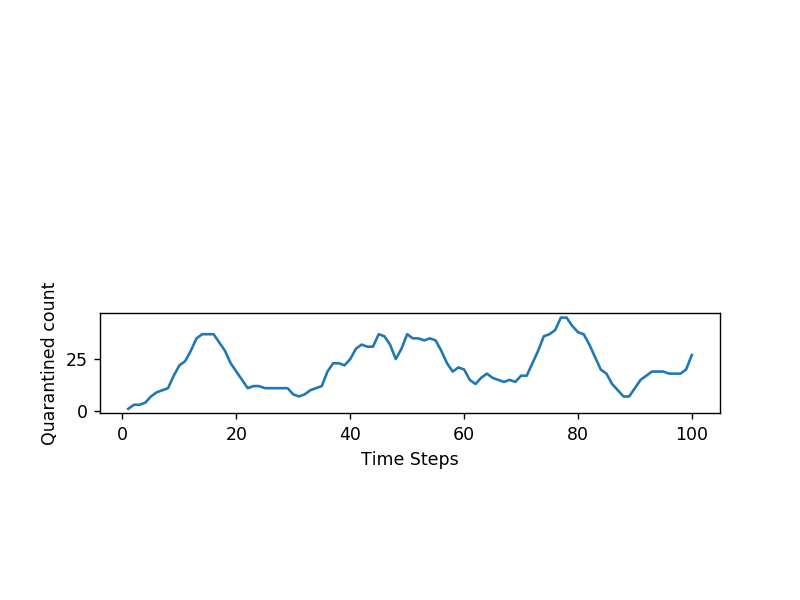

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


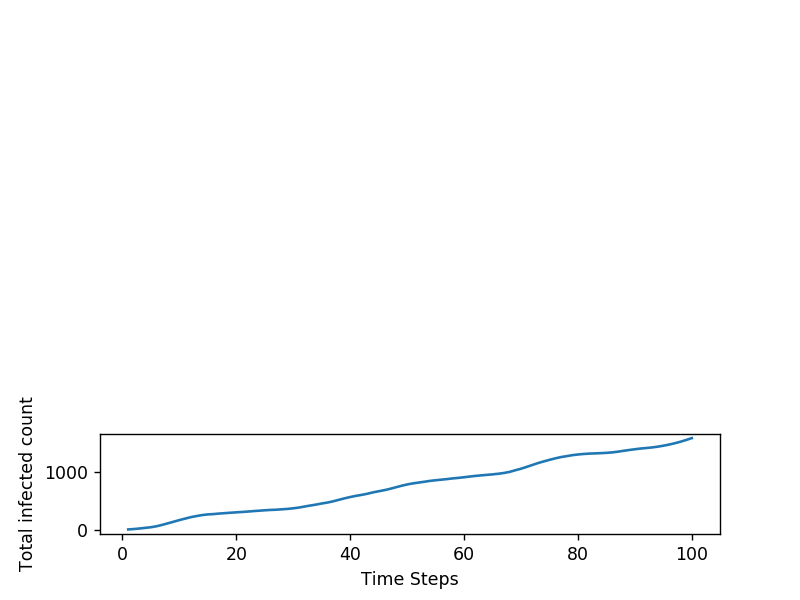

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


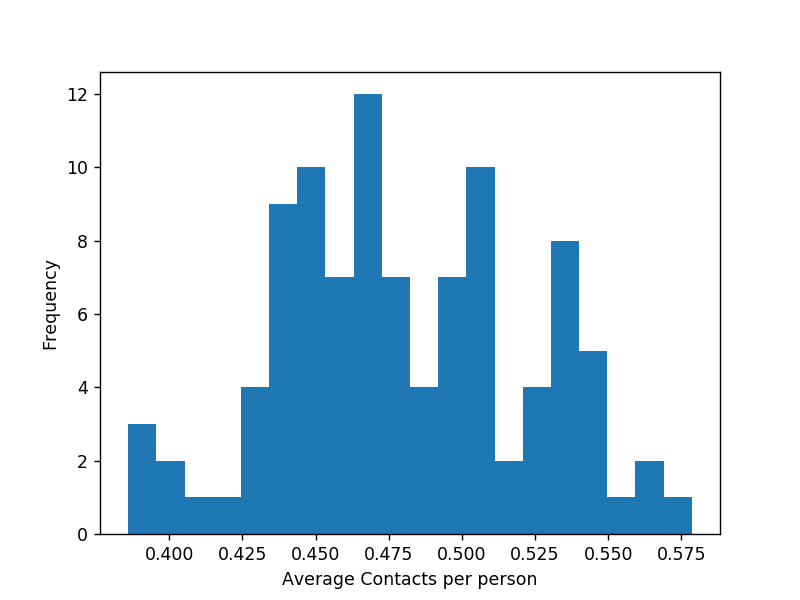

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [235]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3  
members = np.matrix([[0.0]*5]*N)
mu = 5.1 # mean
sigma = 1.1 # standard deviation
for i in range(N):
    members[i, 1] = round(np.random.normal(mu, sigma))

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1
    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


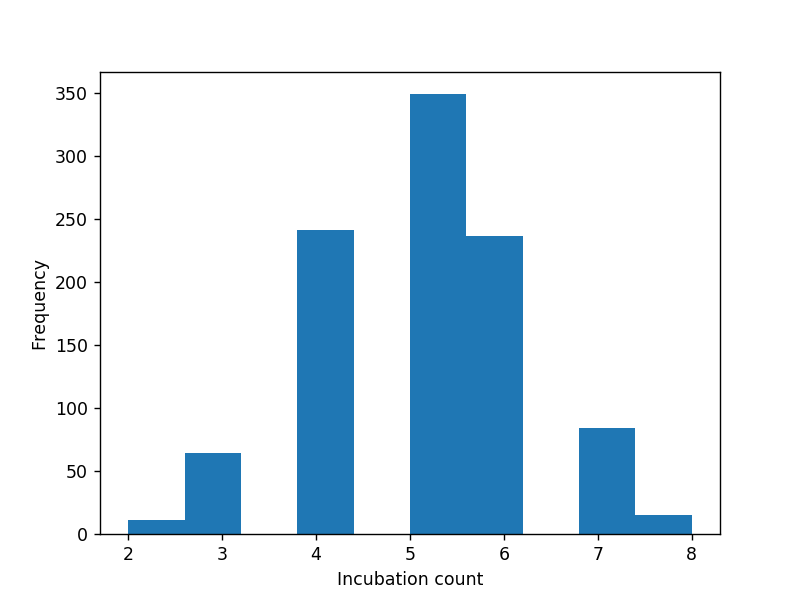

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Incubation count')]

In [275]:
nd_sums = [np.sum(members, 1)[i,0] for i in range(N)]
nd_sums

fig6 = plt.figure()
ax6 = fig6.add_subplot(111)
ax6.hist(nd_sums)
ax6.set(xlabel = "Incubation count"
      ,ylabel = "Frequency")

Analysis: There isn't much difference in the overall shape of the curves, but the absolute numbers of infected people in different scenarios vary. In scenarios with low incubation count numbers (scenarios 3 and 2a), the number of infected people at any single time is lower (around 30) than in scenarios with a high count number (scenario 2b) (around 50-60). This makes logical sense because a lower incubation count leads to faster detection and less people getting infected before the infected person is put to quarantine.

#### Variable 7: Vaccination <br>

Up until now there is no available vaccine for COVID-19. But we hope there will be one out soon. But lets be realistic, not everyone in the Yale-NUS community will be able to afford such an expensive vaccine. So, how will the virus spread in our community now that some of our wealthy, lucky members are vaccinated. Lets find out!

We assume the vaccine is 100% effective and gives the individual full immunity against COVID-19.

Note: All other variables are kept constant in this investigation.

##### 60 people vaccinated

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


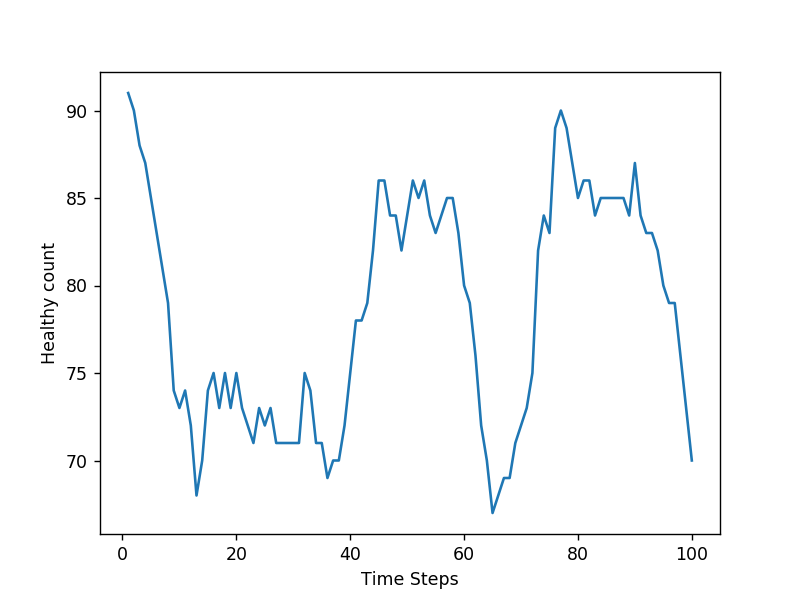

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:123: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


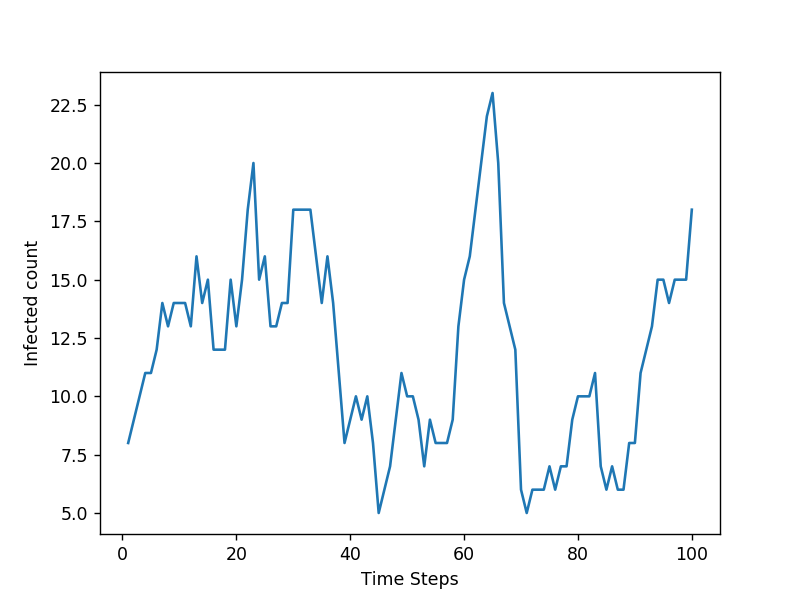

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:129: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


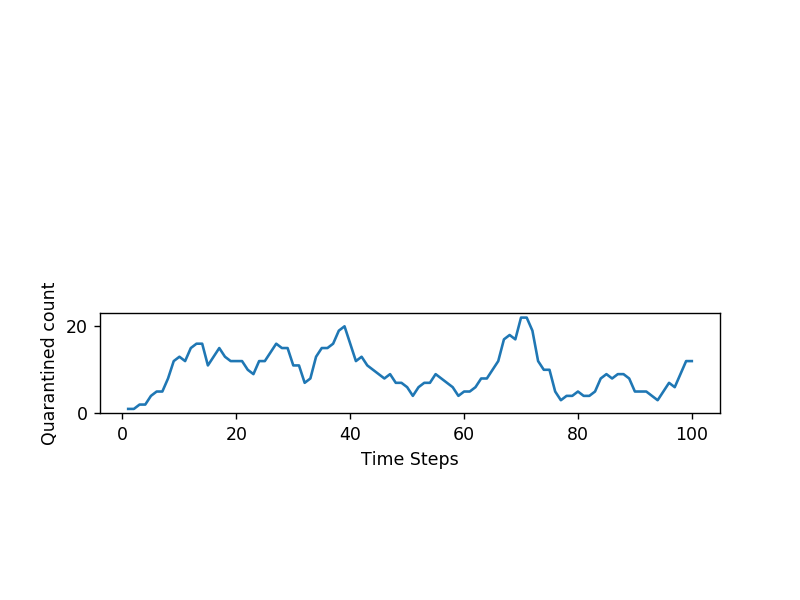

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


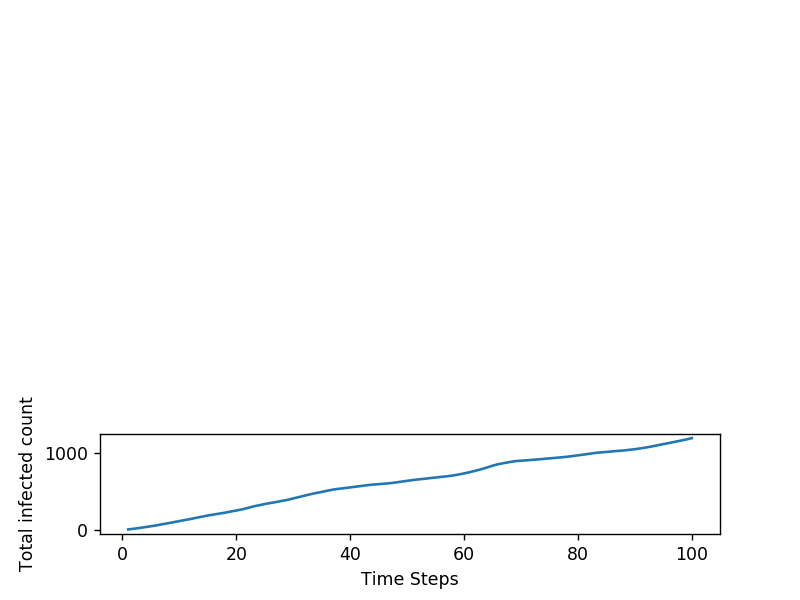

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


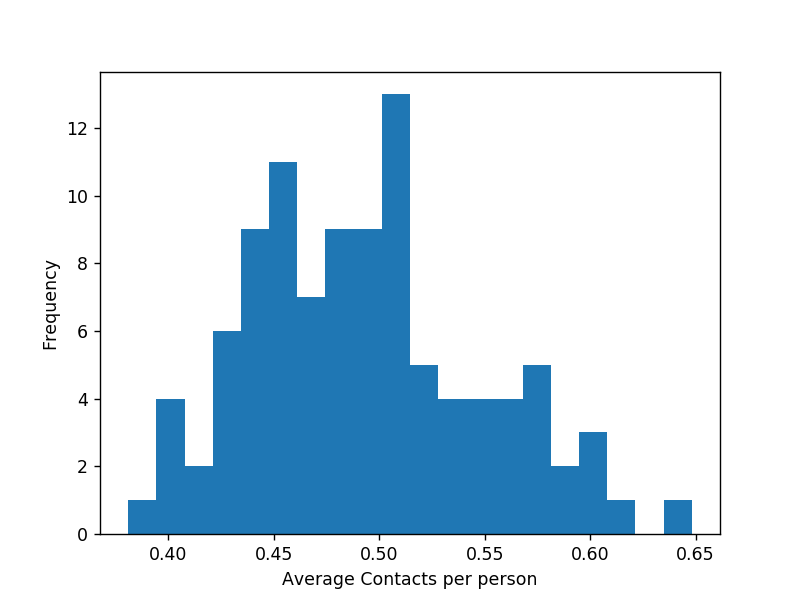

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [250]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 10)

for i in unfortunate_souls:
    members[i,0] = 1

# Randomly select 3o indiduals to vaccinate
fortunate_souls = np.random.randint(0, N-1, 60)

for i in fortunate_souls:
    members[i,0] = 3

    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                elif members[j,0]==3: # check if person is vaccinated:
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    vaccinated = np.sum(members==3, 0)[0,0]
    healthy += vaccinated
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### 75 people vaccinated

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


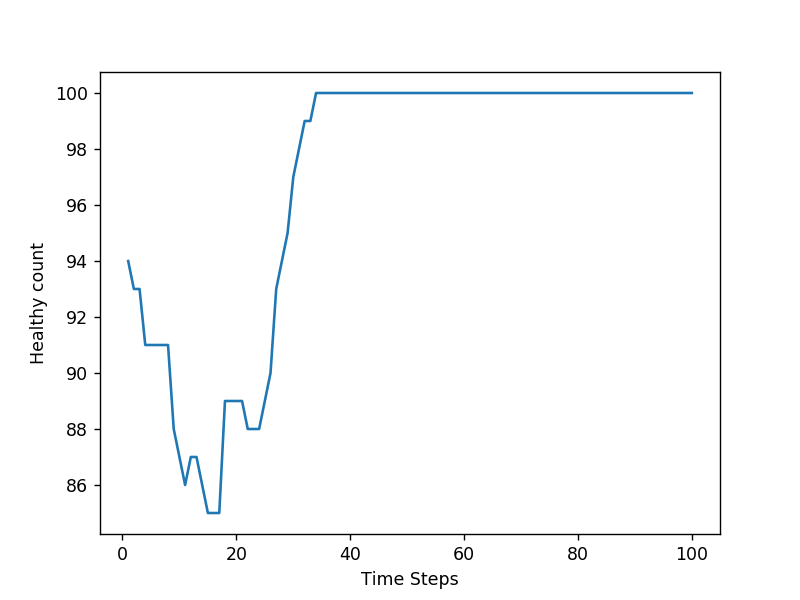

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:123: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


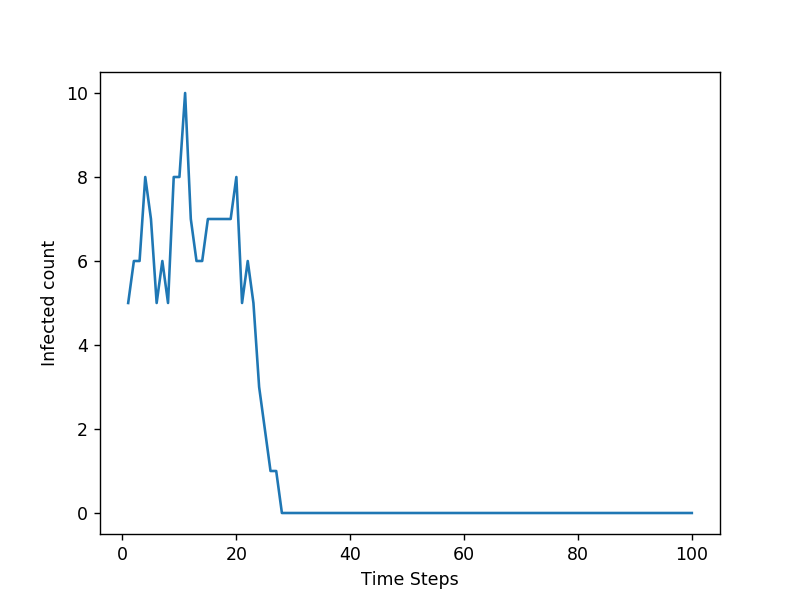

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:129: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


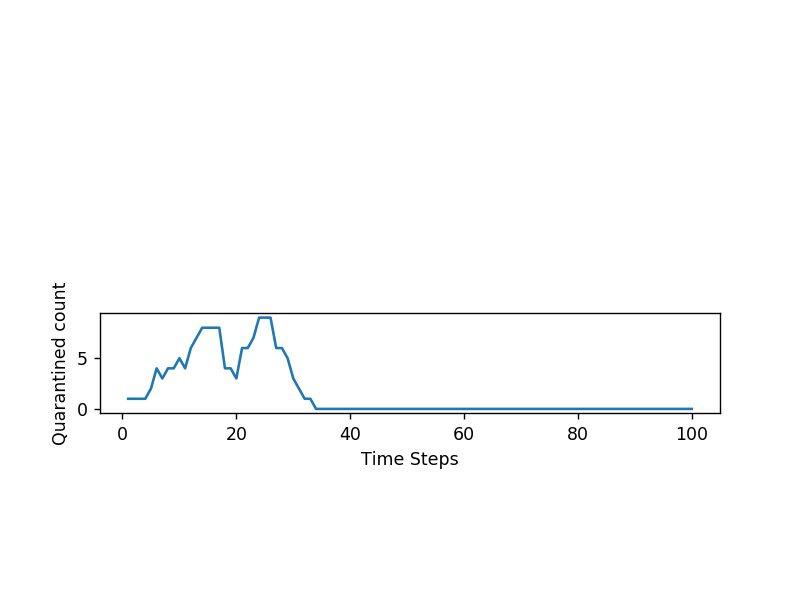

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


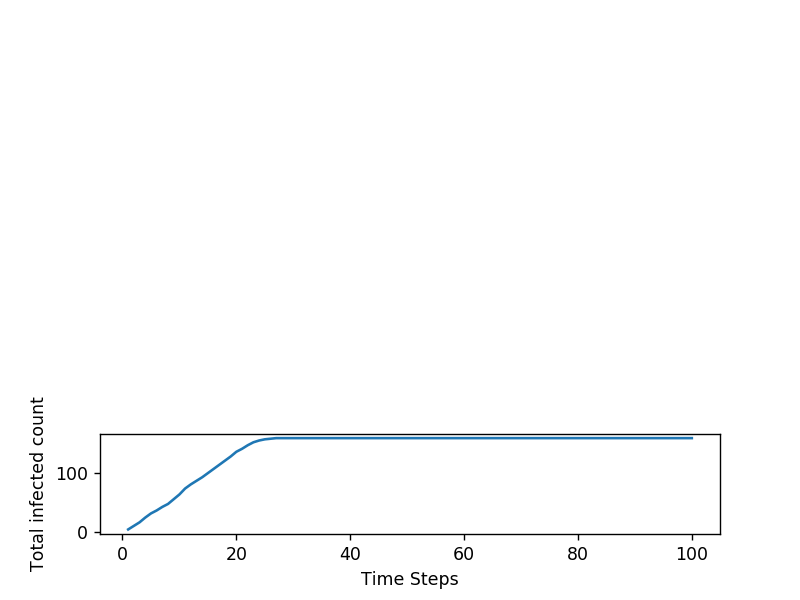

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


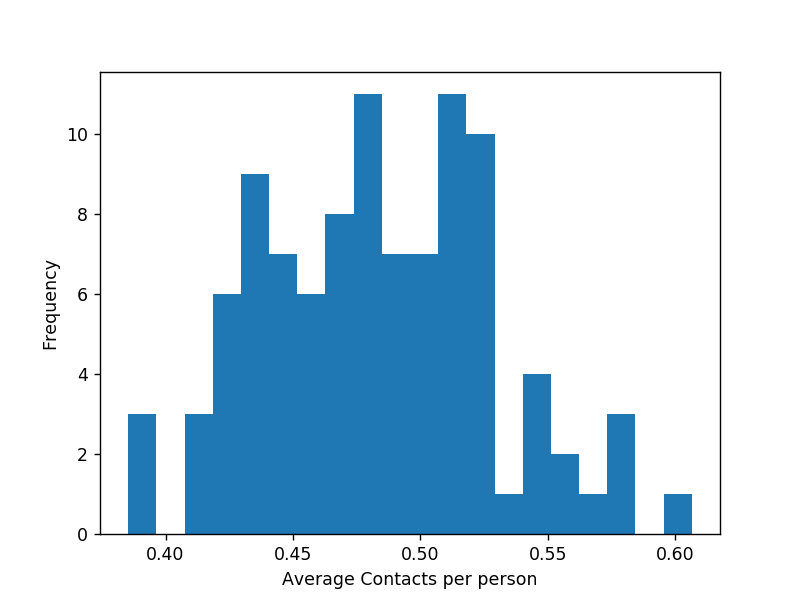

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [254]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 10)

for i in unfortunate_souls:
    members[i,0] = 1

# Randomly select 3o indiduals to vaccinate
fortunate_souls = np.random.randint(0, N-1, 75)

for i in fortunate_souls:
    members[i,0] = 3

    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                elif members[j,0]==3: # check if person is vaccinated:
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    vaccinated = np.sum(members==3, 0)[0,0]
    healthy += vaccinated
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

##### 90 people vaccinated

100


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


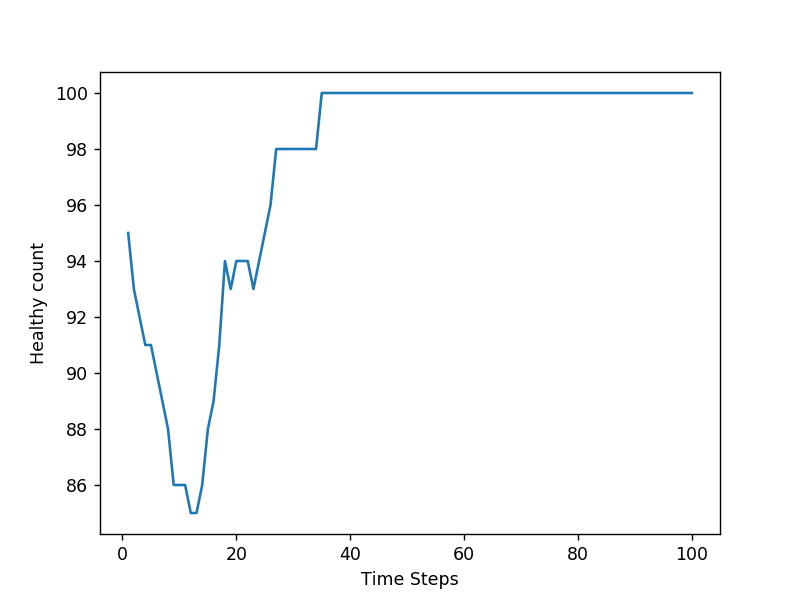

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:123: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


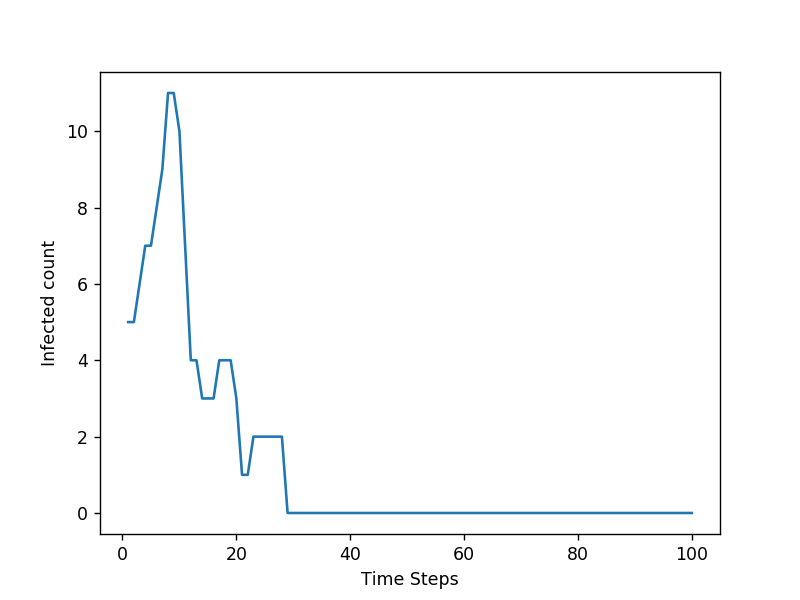

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:129: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


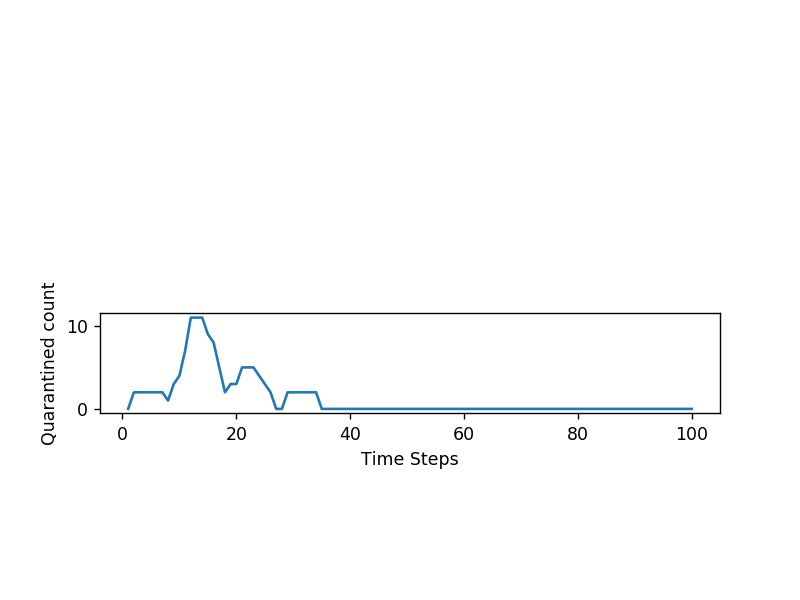

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


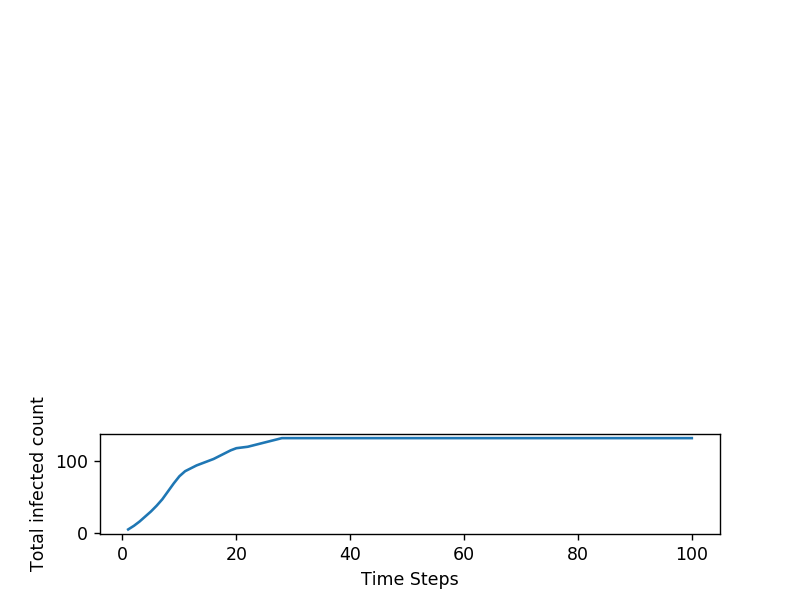

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


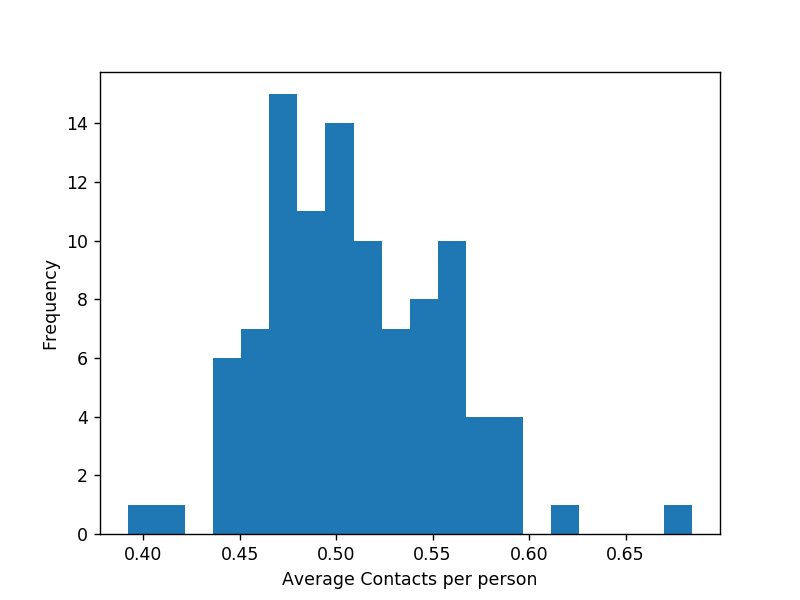

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [257]:
# Step 1
N = 100
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
for i in range(N):
    members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 10)

for i in unfortunate_souls:
    members[i,0] = 1

# Randomly select 3o indiduals to vaccinate
fortunate_souls = np.random.randint(0, N-1, 90)

for i in fortunate_souls:
    members[i,0] = 3

    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 100

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                elif members[j,0]==3: # check if person is vaccinated:
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 7:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    vaccinated = np.sum(members==3, 0)[0,0]
    healthy += vaccinated
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: Vaccinating an individual essentially removes the individual from our population matrix. So the higher the number of people vaccinated, the fewer the number of people who are left in our population matrix to loop over. So the best strategy is to vaccinate as many people as possible. A 90% vaccination rate as seen above causes the virus to disappear from our population fairly quickly.

### Let's wrap it up. 
## SIMULATE THE SPREAD OF COVID-19 IN THE YALE-NUS COMMUNITY!!!!!

We have already seen in detail how the different variables in our system (7 of them in total) affect the results. Now its time to choose the values of the variables of in a way such that our system resembles the Yale-NUS Community (and the reality of our world and the virus) optimally. <br>
(1) Population matrix values <br>
(2) Population size <br>
(3) Initialization: No. of people infected at the beginning <br>
(4) Timesteps <br>
(5) Quarantine period <br>
(6) Incubation period <br>
(7) Vaccination <br>

### So lets explore and find out!!!

### So what are ideal values for our variables?

(1) In previous simulations we drew numbers from an exponential distribution to model interactions in our community. The row sums for our interactions matrix (or population matrix) usually hovered around 0.7-0.9 on average, for beta values that yielded oscillatory behaviours. Though we do not have concrete evidence to assume that the spread of the virus should follow an oscillatory pattern, we do recognize that the behaviour marks a boundary between 2 other type of results, (1) Contagion is low so nobody gets infected from contacts and (2) Contagion is high and everyone gets infected. But we think in a community like ours the average number of contacts per day should be much higher. So for each member of our community we have randomly selected 5 other contacts for which we draw numbers from a uniform distribution between 0 and 1. This is done against a backdrop of numbers drawn from an exponential distribution. We hope the row sums now will reflect average number of contacts that are more in line with reality. <br>

(2) The student population size of Yale-NUS is around 1000. <br>

(3) It is hard to say how many people will contract the disease from contact with the outside world, but lets assume it to be 5 in our case. <br>

(4) We will run our simulations for 120 days (typical length of a semester at Yale-NUS). <br>

(5) The Singaporean government has set the quarantine period to 14 days. <br>

(6) We think a normal distribution with a mean of 5.1 days and a standard deviation of 1.1 days best represent the distributtion of the incubation period. Please refer to scenario 3 earlier for more details. <br>

(7) There is no vaccination for COVID-19 yet so we will ignore it in our simulations. <br>

1000


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:127: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


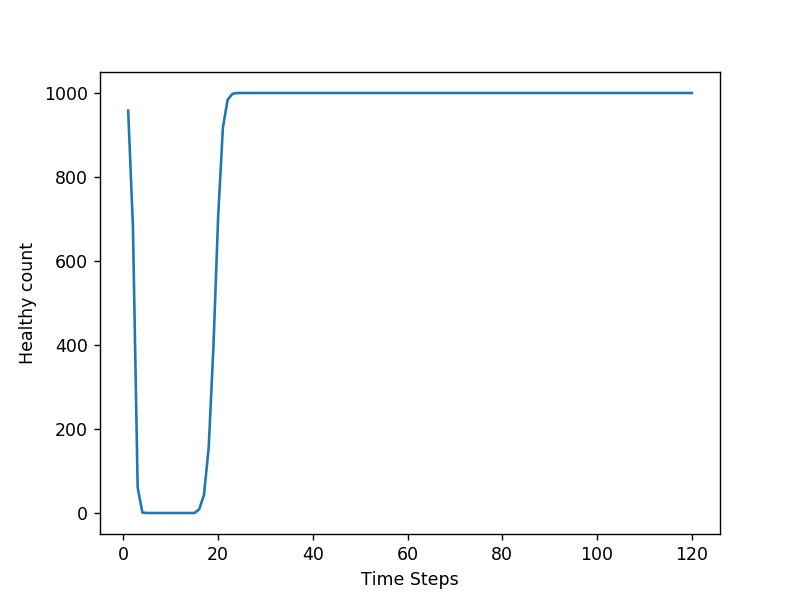

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:133: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


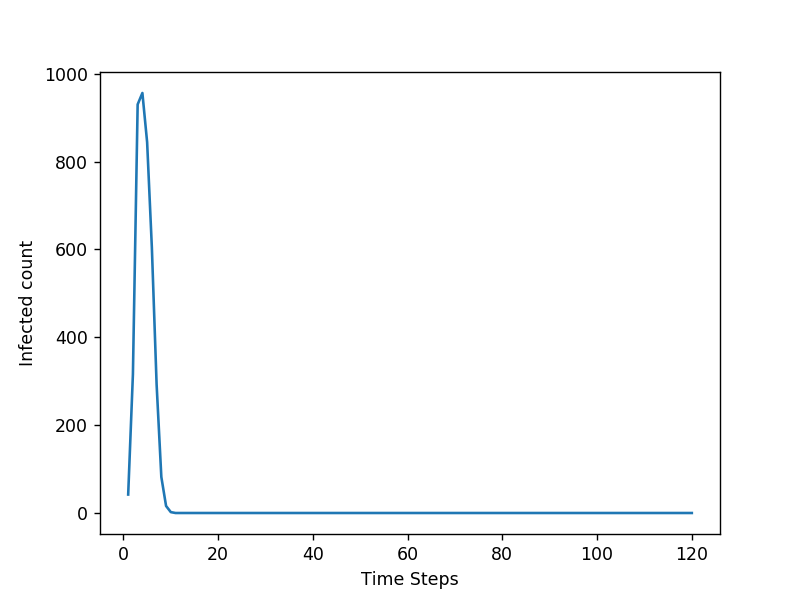

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:139: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


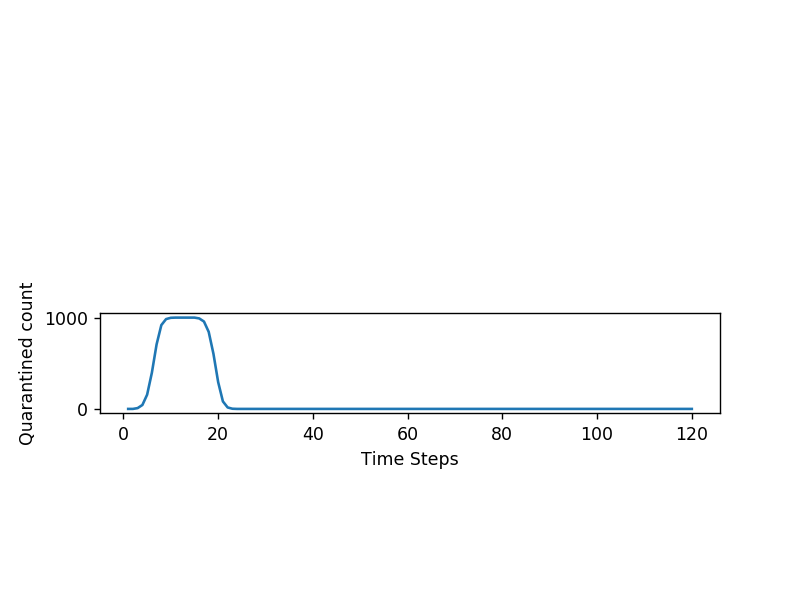

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:145: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


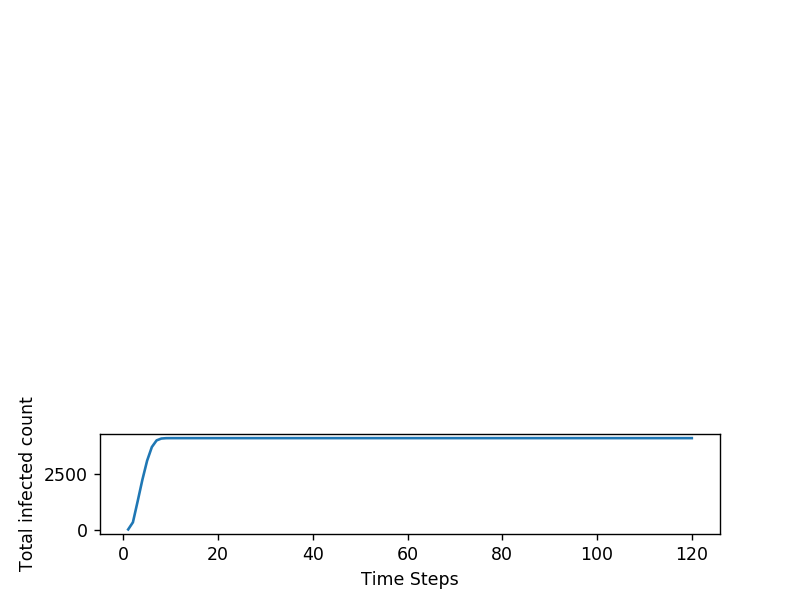

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:152: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


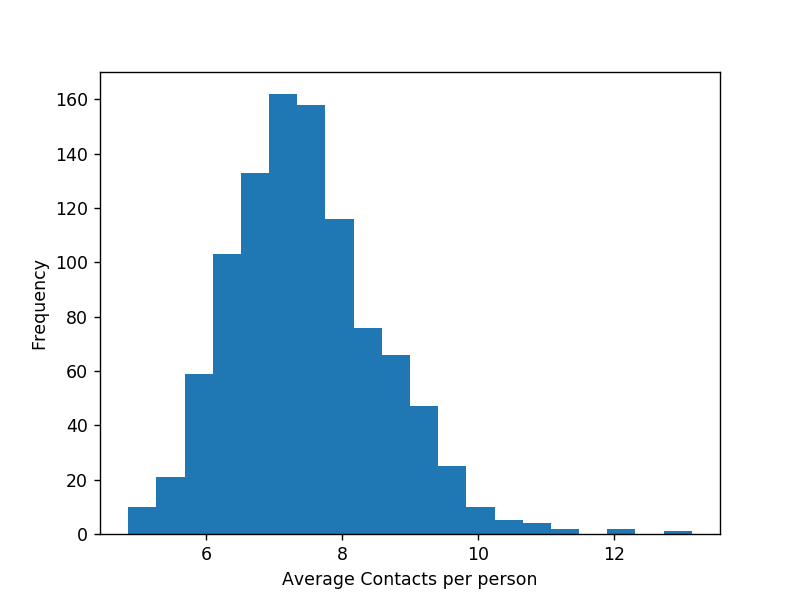

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [320]:
# Step 1
N = 1000
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(N):
    close_contacts = np.random.randint(0, N-1, 5)
    #print(close_contacts) 
    for j in close_contacts:
        pop_matrix[i,j]=np.random.random()
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
mu = 5.1 # mean
sigma = 1.1 # standard deviation
for i in range(N):
    members[i, 1] = round(np.random.normal(mu, sigma))
# for i in range(N):
#     members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1

# # Randomly select 3o indiduals to vaccinate
# fortunate_souls = np.random.randint(0, N-1, 90)

# for i in fortunate_souls:
#     members[i,0] = 3

    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 120

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                elif members[j,0]==3: # check if person is vaccinated:
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    vaccinated = np.sum(members==3, 0)[0,0]
    healthy += vaccinated
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: The contagion is too high. (Almost) Everyone gets infected and are subsequently quarantined. This seems to be highly unlikely. Therefore we must need to make changes to the system variables. 

##### Check the number of close contacts

In [300]:
print(np.sum(pop_matrix > 0.5))
print(np.sum(pop_matrix > 0.2))
print(np.sum(pop_matrix > 0.1))
print(np.sum(pop_matrix > 0.05))
print(np.sum(pop_matrix > 0.01))
print(np.sum(pop_matrix >= 0))

2478
4028
4548
4900
140082
1000000


##### Lets introduce close contact tracing and see its effects

1000


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


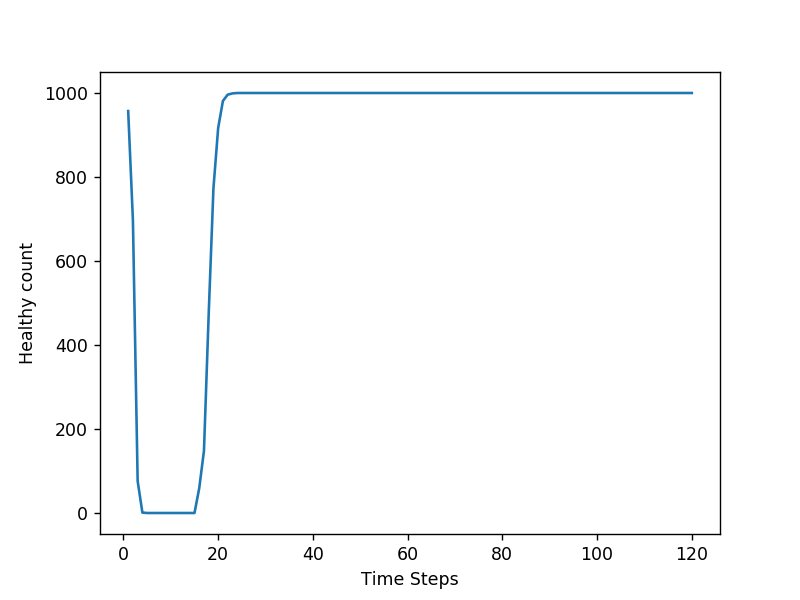

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:143: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


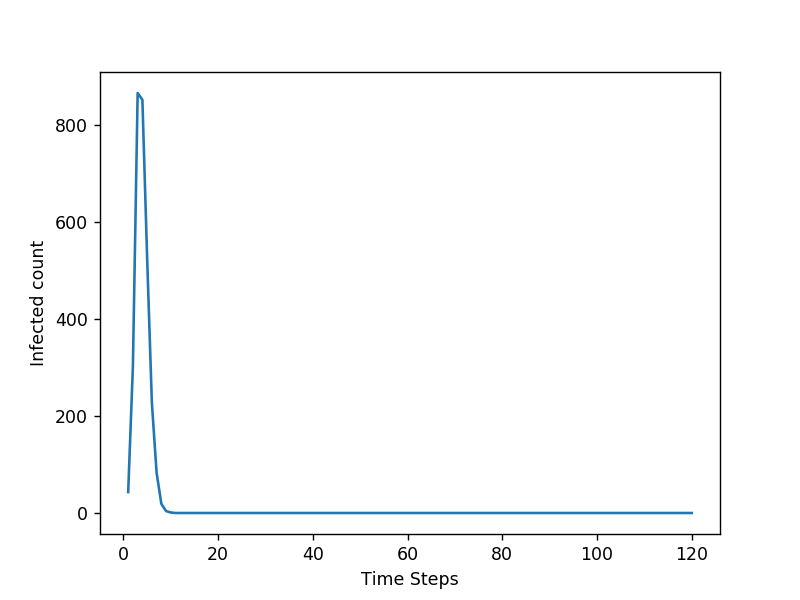

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


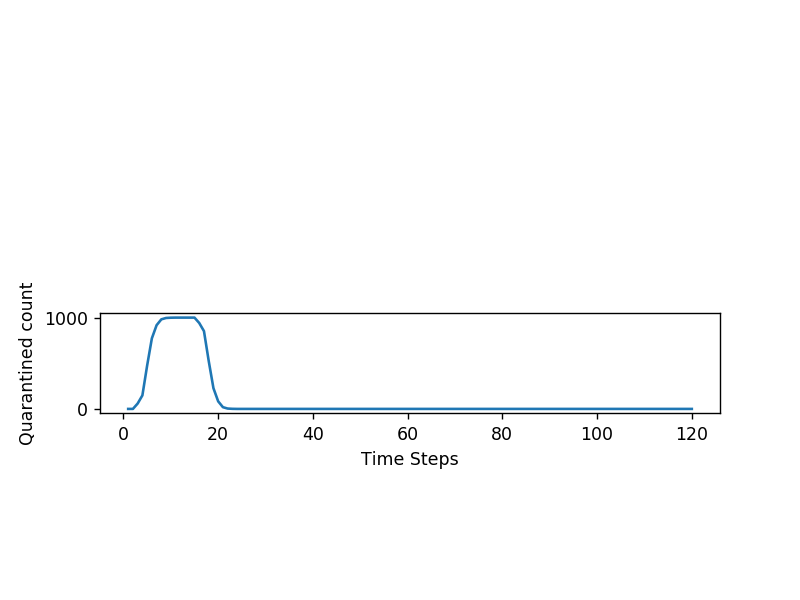

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:155: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


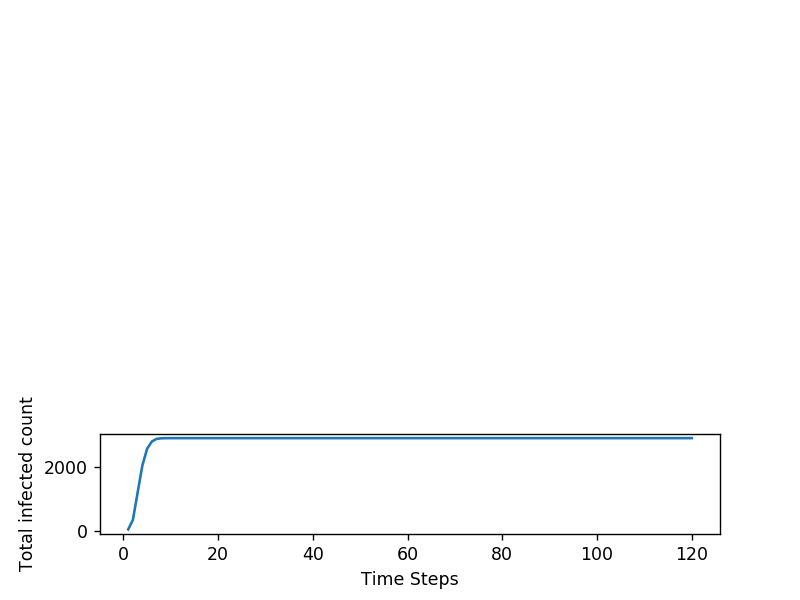

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


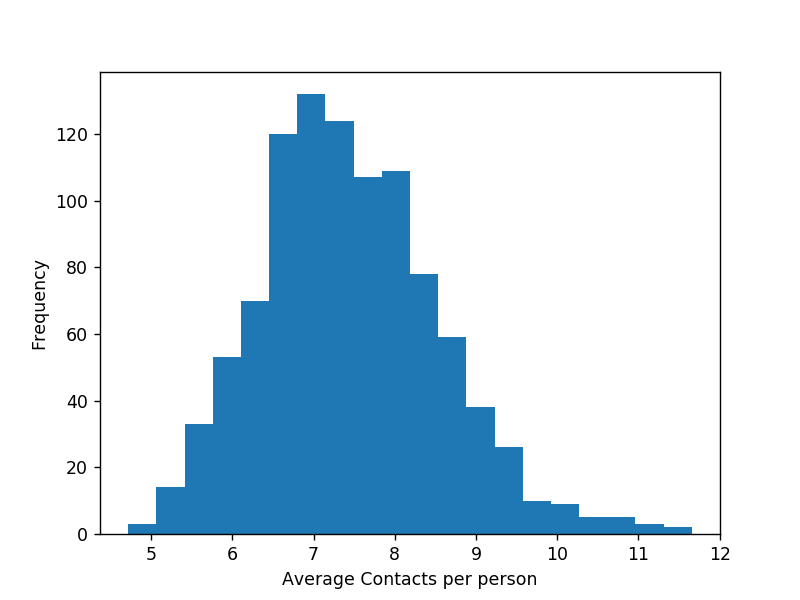

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [321]:
# Step 1
N = 1000
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
for i in range(N):
    close_contacts = np.random.randint(0, N-1, 5)
    #print(close_contacts) 
    for j in close_contacts:
        pop_matrix[i,j]=np.random.random()
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
mu = 5.1 # mean
sigma = 1.1 # standard deviation
for i in range(N):
    members[i, 1] = round(np.random.normal(mu, sigma))
# for i in range(N):
#     members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1

# Vaccine doesn't exist yet
# # Randomly select 3o indiduals to vaccinate
# fortunate_souls = np.random.randint(0, N-1, 90)

# for i in fortunate_souls:
#     members[i,0] = 3

    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0
            for ii in range(N):
                if pop_matrix[i, ii] > 0.05: # contact tracing
                    members[ii,0] = 2

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 120

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                elif members[j,0]==3: # check if person is vaccinated:
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
                for ii in range(N):
                    if pop_matrix[i, ii] > 0.05: # check the close contacts for the person, and quarantine them
                        members[ii,0] = 2
                        members[ii,2] = 0
                        
                    
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    vaccinated = np.sum(members==3, 0)[0,0]
    healthy += vaccinated
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: The contagion is still too high. Everyone gets quarantined. But one key difference with the previous simulation is the difference in the number of infected people at the same time (1000 vs 900). There are fewer people infected at the same time at any time.  So contact tracing is effective in containing the spread of the virus.

##### Policy changes

The administration adopts policy changes to minimize unnecessary contacts between individuals like restrictive seating arrangements in classes, dining halls and the library. Though these are aimed at reducing random contact between students, these policy changes have no effect on contacts between close friends. LETS SEE WHAT HAPPENS?

1000


C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


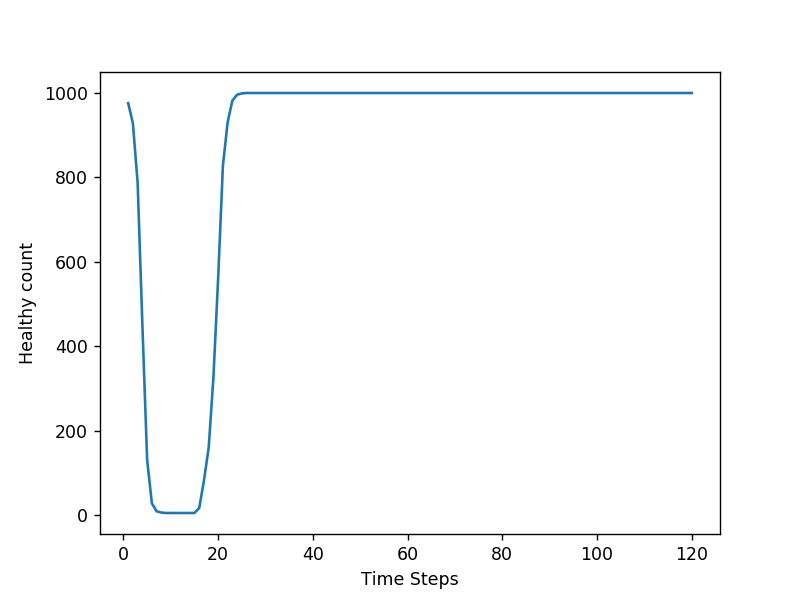

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:146: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


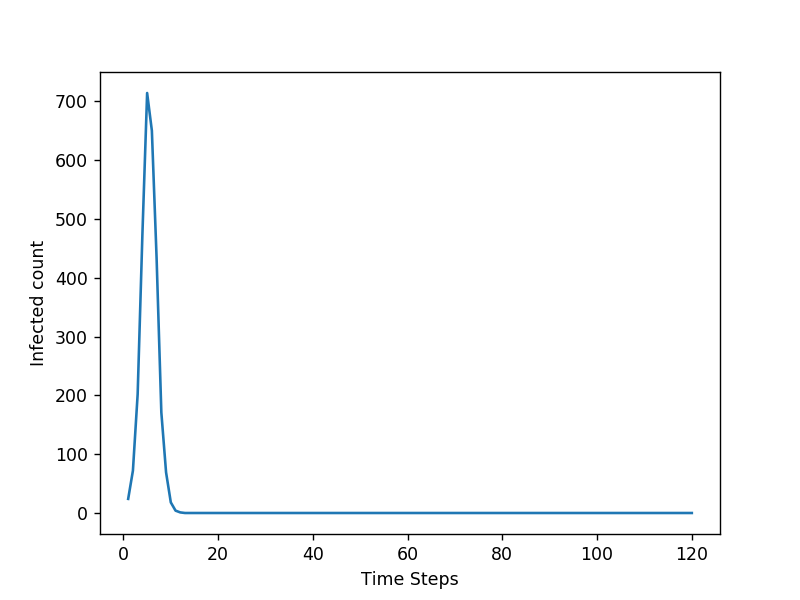

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:152: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


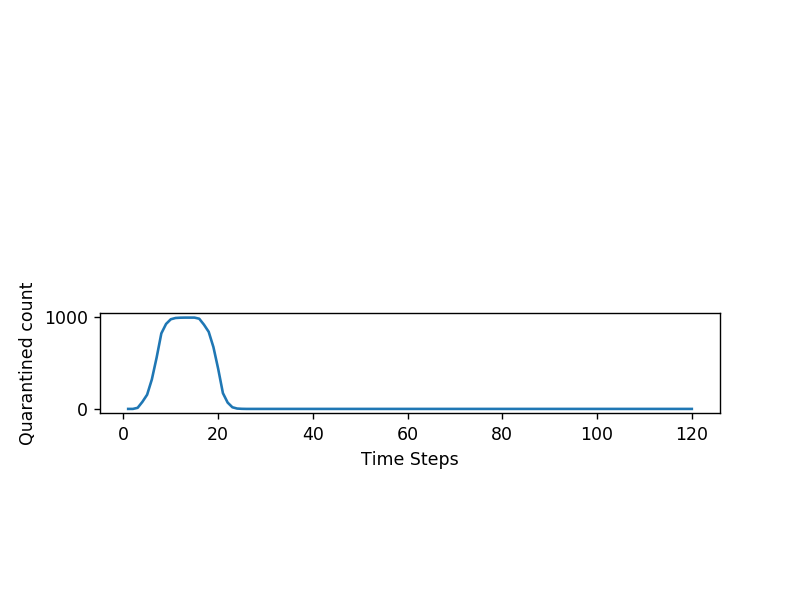

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:158: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


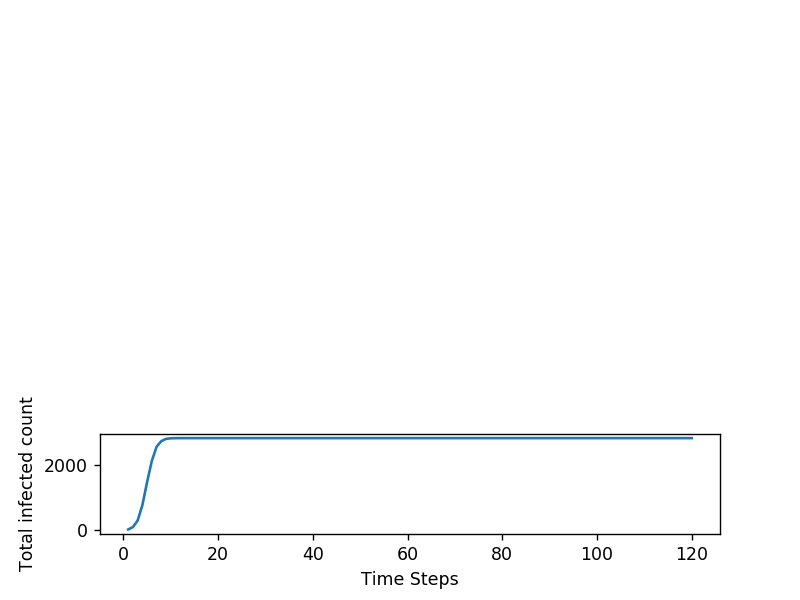

C:\Users\Asus\Anaconda3\lib\site-packages\ipykernel_launcher.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


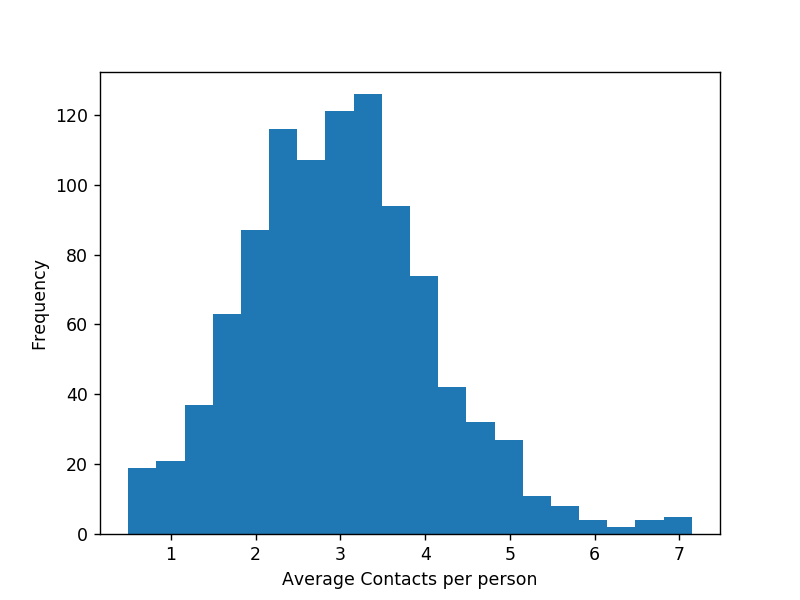

[Text(0, 0.5, 'Frequency'), Text(0.5, 0, 'Average Contacts per person')]

In [322]:
# Step 1
N = 1000
pop_matrix = np.matrix([[0.0]*N]*N)

# Step 2
row_size = len(pop_matrix)
print(row_size)

for i in range(row_size):
    for j in range(row_size):
        if j >= i:
            pop_matrix[i,j] = np.random.exponential(0.005, 1)
            
# Policy change: We assume it reduces all random contacts by a factor of 10
pop_matrix = pop_matrix/10
            
for i in range(N):
    close_contacts = np.random.randint(0, N-1, 5)
    #print(close_contacts) 
    for j in close_contacts:
        pop_matrix[i,j]=np.random.random()
            
for i in range(row_size):
    for j in range(row_size):
        pop_matrix[j,i] = pop_matrix[i,j]

# maximum = np.max(pop_matrix)
# def normalizer(x, maxi):
#     return (x/maxi)

# pop_matrix = normalizer(pop_matrix, maximum)

for i in range(row_size):
    pop_matrix[i,i] = 0

# Step 3    
members = np.matrix([[0.0]*5]*N)
mu = 5.1 # mean
sigma = 1.1 # standard deviation
for i in range(N):
    members[i, 1] = round(np.random.normal(mu, sigma))
# for i in range(N):
#     members[i, 1] = np.random.randint(2, 15, 1)

# Step 4
# Randomly select individuals in the community who gets infected from their interactions outside the community
unfortunate_souls = np.random.randint(0, N-1, 5)

for i in unfortunate_souls:
    members[i,0] = 1

# Vaccine doesn't exist yet
# # Randomly select 3o indiduals to vaccinate
# fortunate_souls = np.random.randint(0, N-1, 90)

# for i in fortunate_souls:
#     members[i,0] = 3

    
for i in range(N):
    if members[i,0] == 1:
        members[i,2] += 1
        if members[i,1] == members[i,2]:
            members[i,0] = 2
            members[i,2] = 0
            for ii in range(N):
                if pop_matrix[i, ii] > 0.05: # contact tracing
                    members[ii,0] = 2

# Step 5: loop

total_infected = 0

healthy_list = []
infected_list = []
quarantined_list = []
total_infected_list = []

timeSteps = 120

for t in range(timeSteps):
    
    # Step 5(a)
    for i in range(N):
        if members[i,0]==1: # check if person is already infected
            #print(i)
            for j in range(N):
                if members[j,0]==2: # check if person is quarantined
                    continue
                elif members[j,0]==3: # check if person is vaccinated:
                    continue
                else:
                    x = np.random.rand()
                    if x < pop_matrix[i,j]: # check if person j contracts the disease from person i
                        members[j,4] = 1

    for i in range(N):
        if members[i,4] == 1:
            members[i,0] = 1
            members[i,4] = 0
            
    # Step 5(b)
    for i in range(N):
        if members[i,0] == 1:
            members[i,2] += 1
            if members[i,1] == members[i,2]:
                members[i,0] = 2
                members[i,2] = 0
                for ii in range(N):
                    if pop_matrix[i, ii] > 0.05: # check the close contacts for the person, and quarantine them
                        members[ii,0] = 2
                        members[ii,2] = 0
                        
                    
    
    # Step 5(c)
    for i in range(N):
        if members[i,0] == 2:
            members[i,3] += 1
            if members[i,3] == 14:
                members[i,0] = 0
                members[i,3] = 0
                
    # Step 5(d)
    healthy = np.sum(members==0, 0)[0,0]
    vaccinated = np.sum(members==3, 0)[0,0]
    healthy += vaccinated
    infected = np.sum(members==1, 0)[0,0]
    quarantined = np.sum(members==2, 0)[0,0]
    total_infected += infected

    healthy_list.append(healthy)
    infected_list.append(infected)
    quarantined_list.append(quarantined)
    total_infected_list.append(total_infected)
    

ts = np.linspace(1, timeSteps, timeSteps)

fig1 = plt.figure()
ax1 = fig1.add_subplot(111)
ax1.plot(ts, healthy_list)
ax1.set(xlabel = "Time Steps"
      ,ylabel = "Healthy count")

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.plot(ts, infected_list)
ax2.set(xlabel = "Time Steps"
      ,ylabel = "Infected count")

fig3 = plt.figure()
ax3 = fig3.add_subplot(413)
ax3.plot(ts, quarantined_list)  
ax3.set(xlabel = "Time Steps"
      ,ylabel = "Quarantined count")

fig4 = plt.figure()
ax4 = fig4.add_subplot(414)
ax4.plot(ts, total_infected_list)  
ax4.set(xlabel = "Time Steps"
      ,ylabel = "Total infected count")

mat_sums = [np.sum(pop_matrix, 1)[i,0] for i in range(N)]
fig5 = plt.figure()
ax5 = fig5.add_subplot(111)
ax5.hist(mat_sums, bins = 20)
ax5.set(xlabel = "Average Contacts per person"
      ,ylabel = "Frequency")

Analysis: The contagion is still too high. Everyone gets quarantined. But one key difference with the previous simulation is the difference in the number of infected people at the same time (900 vs 700). There are fewer people infected at the same time at any time. So policy changes are effective in containing the spread of the virus.